In [7]:
# Loading required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# Problem Statement:

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses 
data analytics to purchase houses at a price below their actual values and flip them at a higher price. 

The company is looking at prospective properties to buy houses to enter the market. You are required to build a model 
using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest 
in them or not. For this company wants to know:

• Which variables are important to predict the price of variable?

• How do these variables describe the price of the house?

DATA
Data has 1460 entries and each having 81 variables. 

First, use the train dataset and do the EDA process, fitting the best model and saving the model.

-Then, use the test dataset , load the saved model and predict the values over the test data.

# Loading the train dataset

In [14]:
df=pd.read_csv("train.csv")
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
df.head(15)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,Gas

In [16]:
df.shape    #Checking the dimensions of the dataset

(1168, 81)

There are 1168 rows and 81 columns

In [17]:
df.columns   #Checking out the columns of the dataset

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [18]:
# #Checking the info of all the columns present
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

We can see 3 floats,35 integers and 43 object data types in the above dataset

In [20]:
df.isnull().sum().sort_values(ascending=False).head(30)   #Checking for null values in the dataset for top 30 columns

PoolQC          1161
MiscFeature     1124
Alley           1091
Fence            931
FireplaceQu      551
LotFrontage      214
GarageType        64
GarageCond        64
GarageYrBlt       64
GarageFinish      64
GarageQual        64
BsmtExposure      31
BsmtFinType2      31
BsmtFinType1      30
BsmtCond          30
BsmtQual          30
MasVnrArea         7
MasVnrType         7
Exterior2nd        0
Exterior1st        0
OverallCond        0
ExterQual          0
ExterCond          0
Foundation         0
RoofMatl           0
RoofStyle          0
YearRemodAdd       0
YearBuilt          0
SalePrice          0
OverallQual        0
dtype: int64

 In the dataset we can observe some null values in some columns.There are 1161 missing values in the column PoolQC, 1124 in MiscFeature, 11091 in Alley, 931 in Fence, 551 in FireplaceQu,214 in LotFrontage, 64 each in GarageType, GarageCond, GarageYrBlt, GarageFinish, GarageQual, 31 in BsmtExposure and BsmtFinType2, 30 in BsmtCond and BsmtQual, 7 in MasVnrArea and MasVnrType present in our dataset. We need to handle these null values.
 

In [19]:
# Other attributes
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,954.00000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1161.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1104.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.98847,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310078,444.726027,46.647260,569.721747,1061.095034,1169.860445,348.826199,6.380137,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1978.193841,1.776541,476.860445,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,416.159877,41.940650,24.82875,8957.442311,1.390153,1.124343,30.145255,20.785185,182.595606,462.664785,163.520016,449.375525,442.272249,391.161983,439.696370,50.892844,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,24.890704,0.745554,214.466769,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,1.000000,20.000000,21.00000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,360.500000,20.000000,60.00000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,0.000000,1143.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,338.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,714.500000,50.000000,70.00000,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,0.000000,474.000000,1005.500000,1096.500000,0.000000,0.000000,1468.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,1079.500000,70.000000,80.00000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,0.000000,816.000000,1291.500000,1392.000000,729.000000,0.000000,1795.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,1460.000000,190.000000,313.00000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


# Data pre-processing

In [21]:
#Checking the value counts of categorical data
for column in df.columns:
    if df[column].dtypes == object:
        print(str(column) + ' : ' + str(df[column].unique()))
        print(df[column].value_counts())
        print('\n')

MSZoning : ['RL' 'RM' 'FV' 'RH' 'C (all)']
RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


Street : ['Pave' 'Grvl']
Pave    1164
Grvl       4
Name: Street, dtype: int64


Alley : [nan 'Grvl' 'Pave']
Grvl    41
Pave    36
Name: Alley, dtype: int64


LotShape : ['IR1' 'Reg' 'IR2' 'IR3']
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64


LandContour : ['Lvl' 'Bnk' 'HLS' 'Low']
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64


Utilities : ['AllPub']
AllPub    1168
Name: Utilities, dtype: int64


LotConfig : ['Inside' 'CulDSac' 'FR2' 'Corner' 'FR3']
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


LandSlope : ['Gtl' 'Mod' 'Sev']
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64


Neighborhood : ['NPkVill' 'NAmes' 'NoRidge' 'NWAmes' 'Gilbert' 'Sawyer' 'Edwards'
 'IDOTRR' 'CollgCr' 'Mitchel' 'Crawfor' 'BrDal

Observations:

->There is only one unique value present in utilities column,so that we will be dropping it.

->In categorical columns there are missing values present in columns Alley, MasVnrType, BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, FireplaceQu, GarageType, GarageFinish, GarageQual, GarageCond, PoolQC, Fence, MiscFeature.

In [22]:
#Dropping Utilities column
df.drop(['Utilities'],axis=1,inplace=True)

In [23]:
#Dropping other unnecessary columns in the dataset
df.drop('Id',axis=1,inplace=True)  # id column not necessary for prediction
df.drop('PoolArea',axis=1,inplace=True) # contains same value in every row
df.drop('PoolQC',axis=1,inplace=True) # contains same value in every row

In [24]:
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,NaN,NaN,0,2,2007,WD,Normal,128000
1,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,NaN,NaN,0,10,2007,WD,Normal,268000
2,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,NaN,NaN,0,6,2007,WD,Normal,269790
3,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,NaN,NaN,0,6,2009,WD,Normal,215000
5,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,NaN,NaN,0,11,2006,New,Partial,219210
6,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,NaN,NaN,0,5,2010,WD,Normal,121500
7,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,GasA,TA,Y,SBrkr,832,384,0,1216,0,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1947.0,Unf,1,336,TA,TA,Y,158,0,102,0,0,NaN,NaN,0,10,2008,COD,Abnorml,118500


Checking the percentage of missing data

In [27]:
def missing_values_table(df):
    mis_val = df.isnull().sum()
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(
    columns = {0 : 'Missing Values', 1 : '% of Total Values'})
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
    '% of Total Values', ascending=False).round(1)
    print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
        "There are " + str(mis_val_table_ren_columns.shape[0]) +
            " columns that have missing values.")
    return mis_val_table_ren_columns
missing_values_table(df)

Your selected dataframe has 77 columns.
There are 17 columns that have missing values.


,Missing Values,% of Total Values
MiscFeature,1124,96.2
Alley,1091,93.4
Fence,931,79.7
FireplaceQu,551,47.2
LotFrontage,214,18.3
GarageType,64,5.5
GarageYrBlt,64,5.5
GarageFinish,64,5.5
GarageQual,64,5.5
GarageCond,64,5.5


# Handling missing data

In [29]:
basement=['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']
#NA means No_Basement for all i in basement. Let's replace NAs with 'No_Basement'
for i in basement:
    df[i].fillna('No_Basement',inplace=True)
    print(df[i].value_counts())
    
#As per given definition, NA means None. Let's replace NAs with 'None'
df['MiscFeature'].fillna('None',inplace=True)
print(df['MiscFeature'].value_counts())

#As per given definition, NA means No_alley_access. Let's replace missing data with 'No_alley_access'
df['Alley'].fillna('No_alley_access',inplace=True)
print(df['Alley'].value_counts())

#As per given definition, NA means No_Fence. Let's replace missing data with 'No_Fence'
df['Fence'].fillna('No_Fence',inplace=True)
print(df['Fence'].value_counts())

#NA means No_Fireplace. Let's replace missing data with 'No_Fireplace'
df['FireplaceQu'].fillna('No_Fireplace',inplace=True)
print(df['FireplaceQu'].value_counts())

#Let's Impute the missing values and replace it with the median
df['LotFrontage'].fillna(df['LotFrontage'].median(),inplace=True)

garage=['GarageType','GarageFinish','GarageQual','GarageCond']
#NA means No_Garage for all i in garage
for i in garage:
    df[i].fillna('No_Garage',inplace=True)
    print(df[i].value_counts())
    
#As per dataframe "df" we can say that most of the rows of GarageYrBlt has same value as YearBuilt so we replace with that
df["GarageYrBlt"]=df["GarageYrBlt"].fillna(df["YearBuilt"])
print(df['GarageYrBlt'].value_counts())    
    
#As per given values of MasVnrArea,  Let's replace missing data with 0's
df['MasVnrArea'].fillna(0,inplace=True)
print(df['MasVnrArea'].value_counts())

#Let's fill the missing values in MasVnrType with None
df['MasVnrType'] = df['MasVnrType'].fillna('None')

TA             517
Gd             498
Ex              94
No_Basement     30
Fa              29
Name: BsmtQual, dtype: int64
TA             1041
Gd               56
Fa               39
No_Basement      30
Po                2
Name: BsmtCond, dtype: int64
No             756
Av             180
Gd             108
Mn              93
No_Basement     31
Name: BsmtExposure, dtype: int64
Unf            345
GLQ            330
ALQ            174
BLQ            121
Rec            109
LwQ             59
No_Basement     30
Name: BsmtFinType1, dtype: int64
Unf            1002
Rec              43
LwQ              40
No_Basement      31
BLQ              24
ALQ              16
GLQ              12
Name: BsmtFinType2, dtype: int64
None    1124
Shed      40
Gar2       2
TenC       1
Othr       1
Name: MiscFeature, dtype: int64
No_alley_access    1091
Grvl                 41
Pave                 36
Name: Alley, dtype: int64
No_Fence    931
MnPrv       129
GdPrv        51
GdWo         47
MnWw         10
Name:

In [30]:
#Checking again if missing values present in train dateset
df.isnull().values.any()

False

We can see that the missing data has been handled in the dataset and when we checked the dataset again, there is no missing data present.Output False means there is no null values in the dataset.

# Exploratory Data Analysis (EDA)

# Univariate Analysis

In [31]:
#Taking the categorical data alone and analysing it
categorical=[x for x in df.columns if df[x].dtype==object]

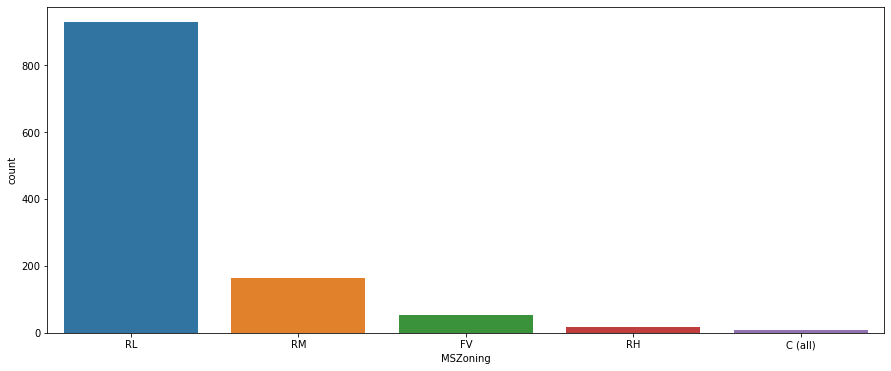

Value counts:

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


Percentage of data: 

RL         79.0
RM         14.0
FV          4.0
RH          1.0
C (all)     1.0
Name: MSZoning, dtype: float64 2


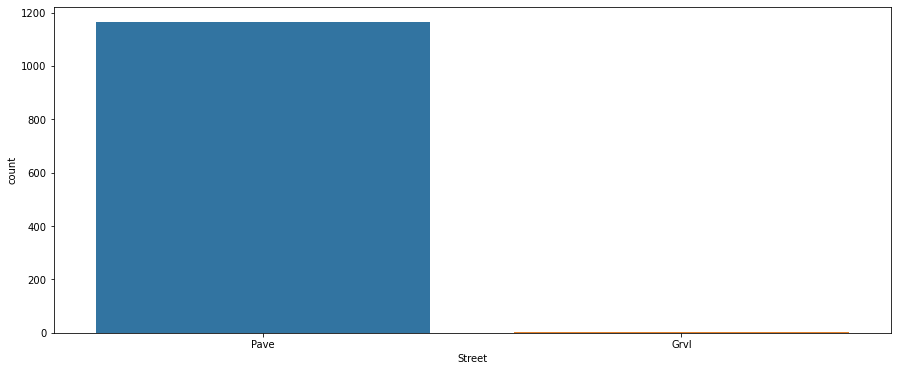

Value counts:

Pave    1164
Grvl       4
Name: Street, dtype: int64


Percentage of data: 

Pave    100.0
Grvl      0.0
Name: Street, dtype: float64 2


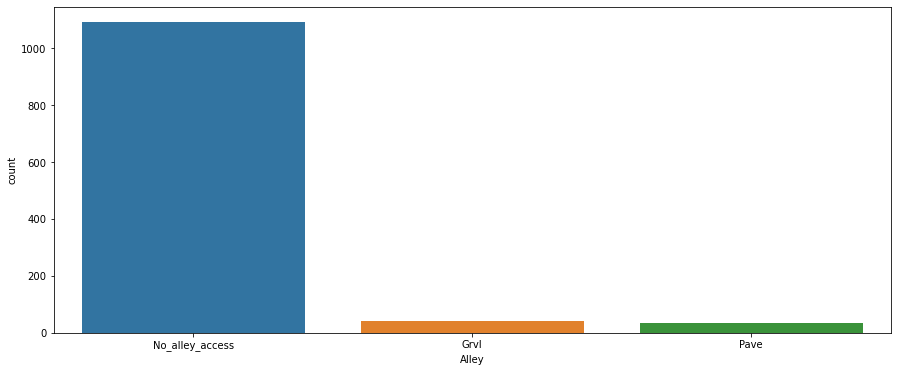

Value counts:

No_alley_access    1091
Grvl                 41
Pave                 36
Name: Alley, dtype: int64


Percentage of data: 

No_alley_access    93.0
Grvl                4.0
Pave                3.0
Name: Alley, dtype: float64 2


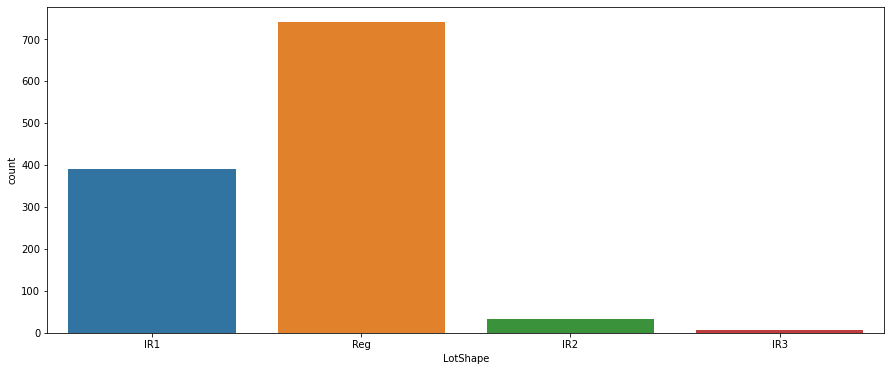

Value counts:

Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64


Percentage of data: 

Reg    63.0
IR1    33.0
IR2     3.0
IR3     1.0
Name: LotShape, dtype: float64 2


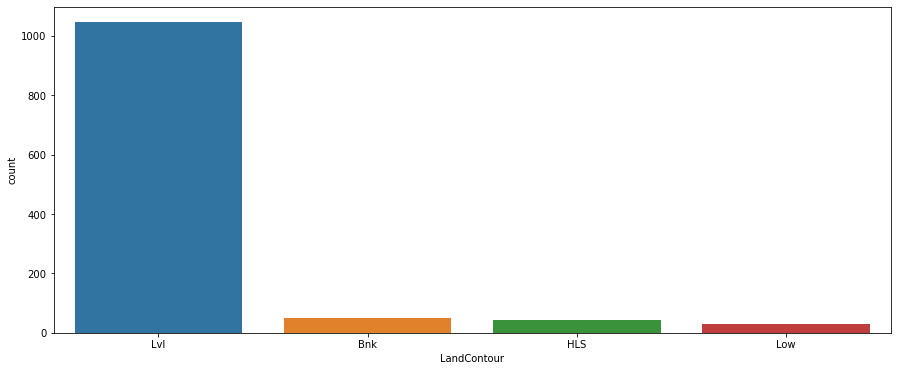

Value counts:

Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64


Percentage of data: 

Lvl    90.0
Bnk     4.0
HLS     4.0
Low     3.0
Name: LandContour, dtype: float64 2


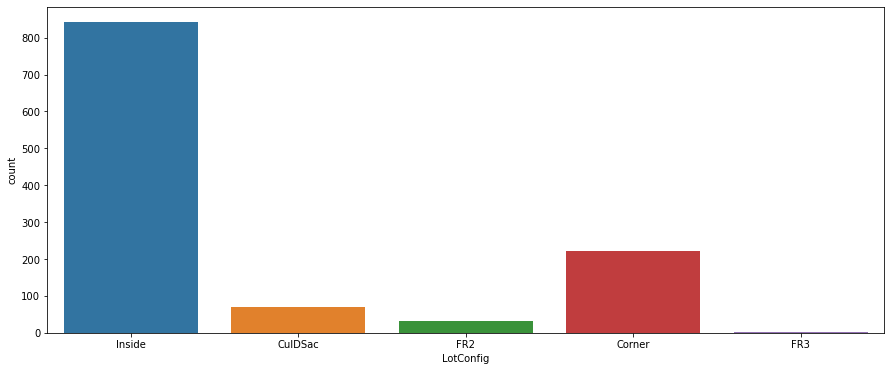

Value counts:

Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


Percentage of data: 

Inside     72.0
Corner     19.0
CulDSac     6.0
FR2         3.0
FR3         0.0
Name: LotConfig, dtype: float64 2


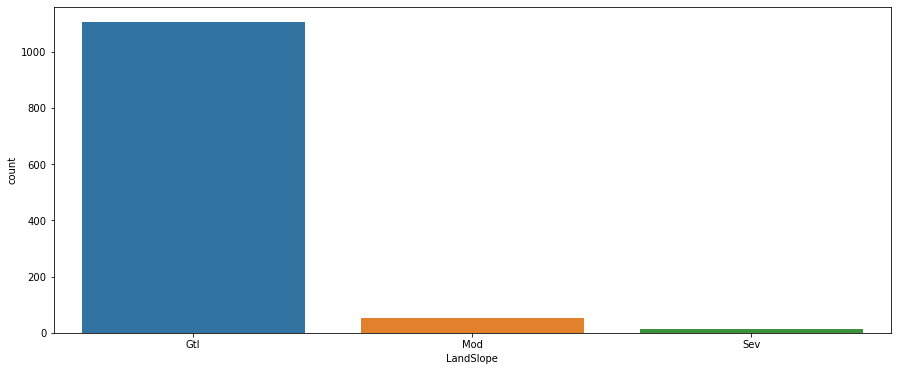

Value counts:

Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64


Percentage of data: 

Gtl    95.0
Mod     4.0
Sev     1.0
Name: LandSlope, dtype: float64 2


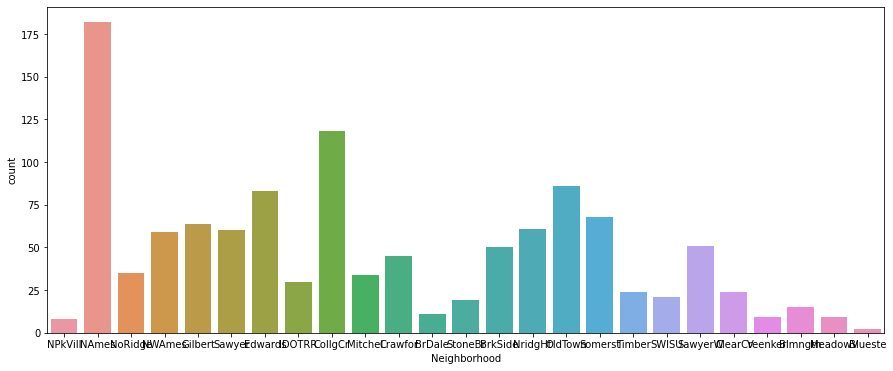

Value counts:

NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
Timber      24
ClearCr     24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
MeadowV      9
Veenker      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64


Percentage of data: 

NAmes      16.0
CollgCr    10.0
OldTown     7.0
Edwards     7.0
Somerst     6.0
Gilbert     5.0
NridgHt     5.0
Sawyer      5.0
NWAmes      5.0
SawyerW     4.0
BrkSide     4.0
Crawfor     4.0
NoRidge     3.0
Mitchel     3.0
IDOTRR      3.0
Timber      2.0
ClearCr     2.0
SWISU       2.0
StoneBr     2.0
Blmngtn     1.0
BrDale      1.0
MeadowV     1.0
Veenker     1.0
NPkVill     1.0
Blueste     0.0
Name: Neighborhood, dtype: float64 2


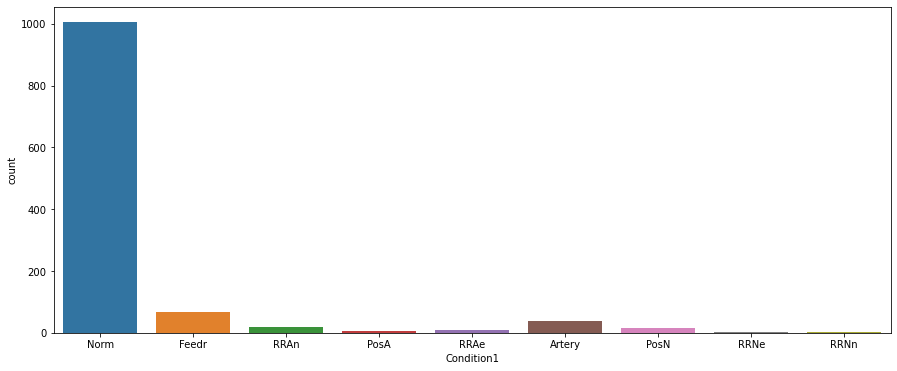

Value counts:

Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64


Percentage of data: 

Norm      86.0
Feedr      6.0
Artery     3.0
RRAn       2.0
PosN       1.0
RRAe       1.0
PosA       1.0
RRNn       0.0
RRNe       0.0
Name: Condition1, dtype: float64 2


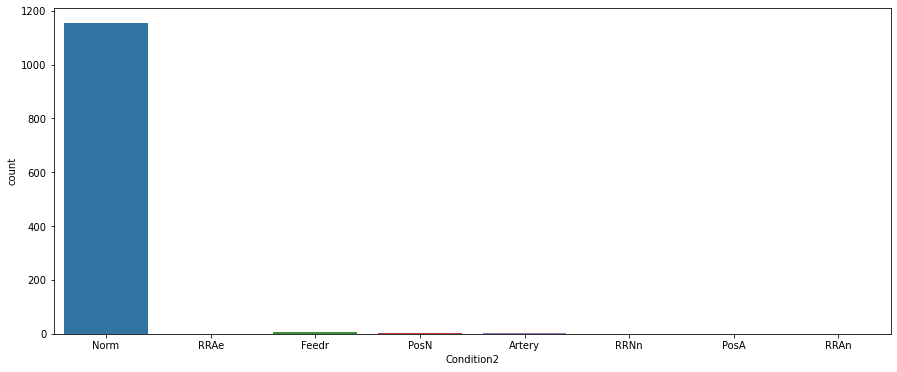

Value counts:

Norm      1154
Feedr        6
PosN         2
Artery       2
RRNn         1
RRAe         1
PosA         1
RRAn         1
Name: Condition2, dtype: int64


Percentage of data: 

Norm      99.0
Feedr      1.0
PosN       0.0
Artery     0.0
RRNn       0.0
RRAe       0.0
PosA       0.0
RRAn       0.0
Name: Condition2, dtype: float64 2


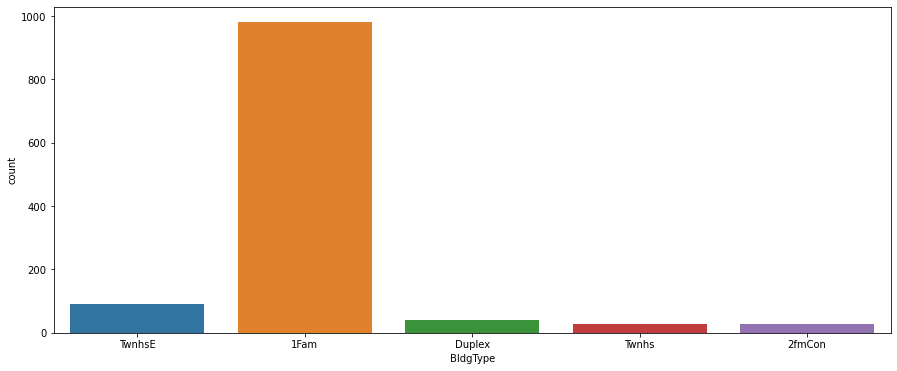

Value counts:

1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64


Percentage of data: 

1Fam      84.0
TwnhsE     8.0
Duplex     4.0
Twnhs      2.0
2fmCon     2.0
Name: BldgType, dtype: float64 2


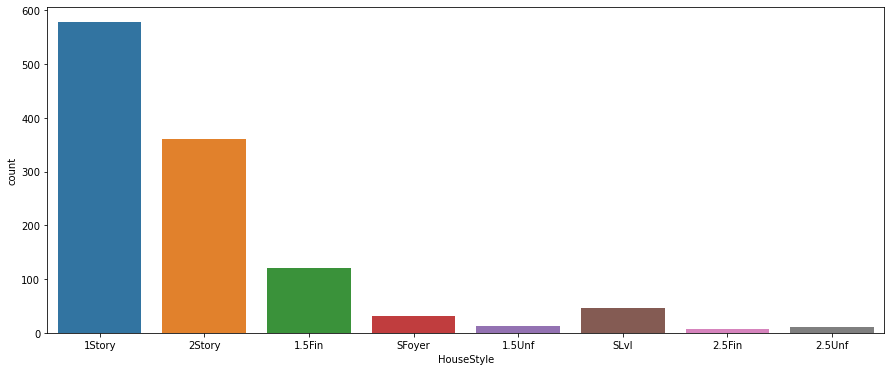

Value counts:

1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64


Percentage of data: 

1Story    49.0
2Story    31.0
1.5Fin    10.0
SLvl       4.0
SFoyer     3.0
1.5Unf     1.0
2.5Unf     1.0
2.5Fin     1.0
Name: HouseStyle, dtype: float64 2


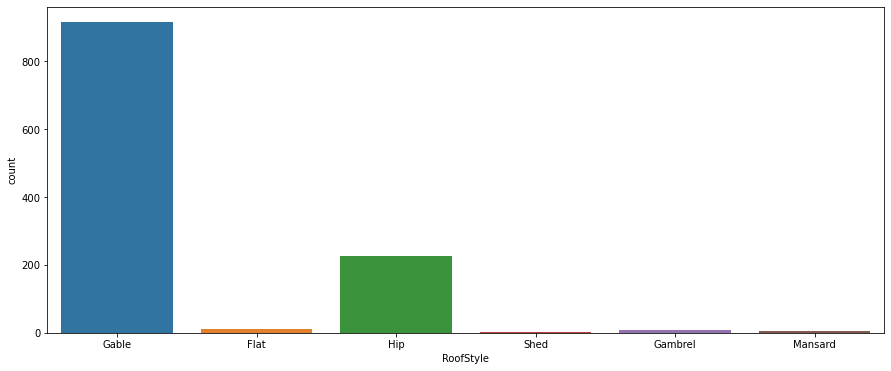

Value counts:

Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64


Percentage of data: 

Gable      78.0
Hip        19.0
Flat        1.0
Gambrel     1.0
Mansard     0.0
Shed        0.0
Name: RoofStyle, dtype: float64 2


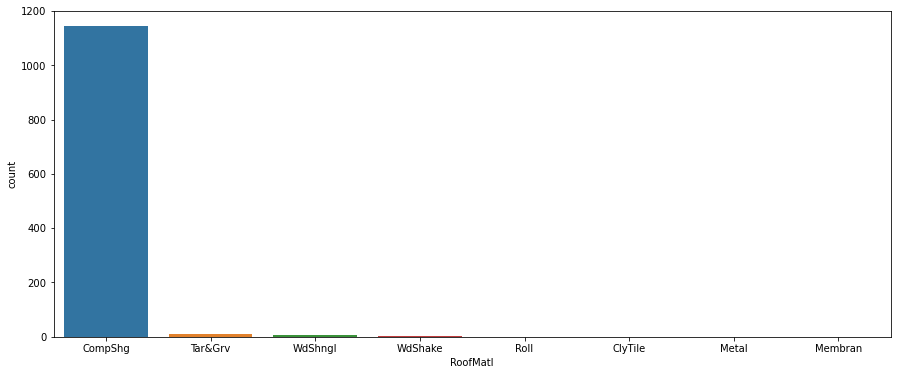

Value counts:

CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
ClyTile       1
Roll          1
Metal         1
Membran       1
Name: RoofMatl, dtype: int64


Percentage of data: 

CompShg    98.0
Tar&Grv     1.0
WdShngl     1.0
WdShake     0.0
ClyTile     0.0
Roll        0.0
Metal       0.0
Membran     0.0
Name: RoofMatl, dtype: float64 2


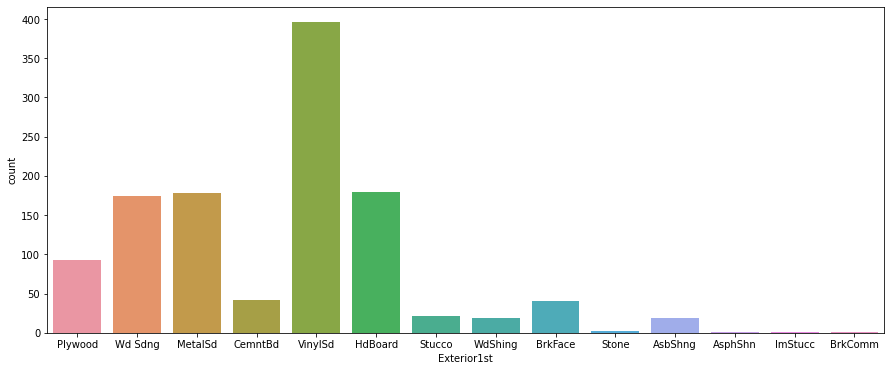

Value counts:

VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
AsbShng     19
WdShing     19
Stone        2
AsphShn      1
BrkComm      1
ImStucc      1
Name: Exterior1st, dtype: int64


Percentage of data: 

VinylSd    34.0
HdBoard    15.0
MetalSd    15.0
Wd Sdng    15.0
Plywood     8.0
CemntBd     4.0
BrkFace     4.0
Stucco      2.0
AsbShng     2.0
WdShing     2.0
Stone       0.0
AsphShn     0.0
BrkComm     0.0
ImStucc     0.0
Name: Exterior1st, dtype: float64 2


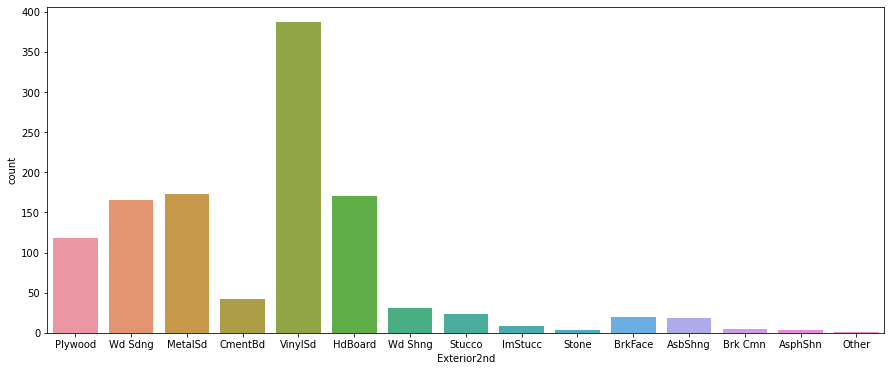

Value counts:

VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64


Percentage of data: 

VinylSd    33.0
MetalSd    15.0
HdBoard    15.0
Wd Sdng    14.0
Plywood    10.0
CmentBd     4.0
Wd Shng     3.0
Stucco      2.0
BrkFace     2.0
AsbShng     2.0
ImStucc     1.0
Brk Cmn     0.0
Stone       0.0
AsphShn     0.0
Other       0.0
Name: Exterior2nd, dtype: float64 2


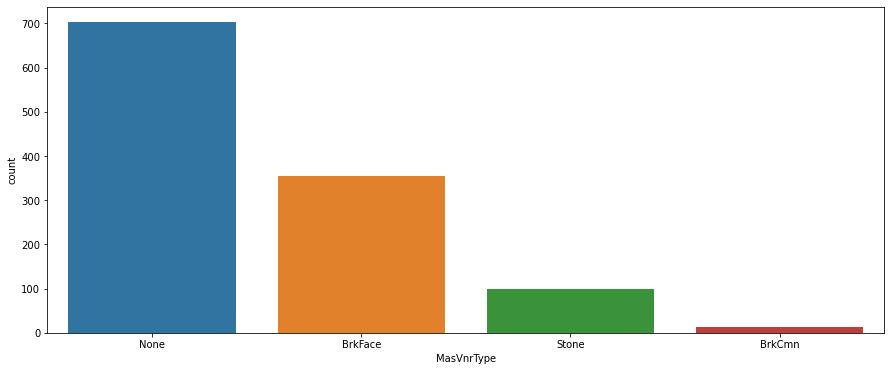

Value counts:

None       703
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64


Percentage of data: 

None       60.0
BrkFace    30.0
Stone       8.0
BrkCmn      1.0
Name: MasVnrType, dtype: float64 2


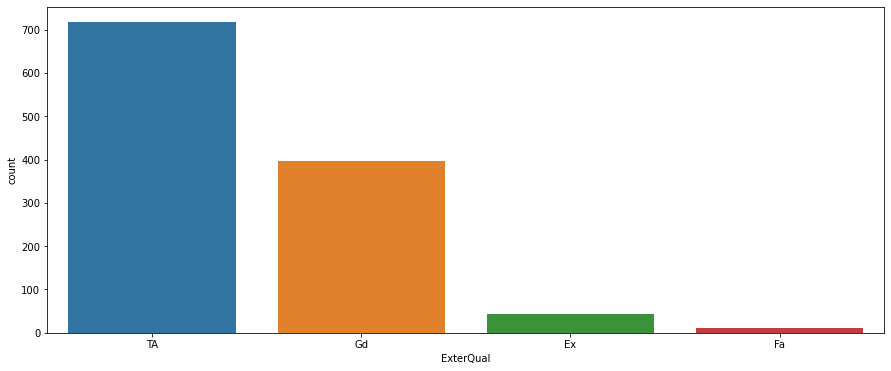

Value counts:

TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64


Percentage of data: 

TA    61.0
Gd    34.0
Ex     4.0
Fa     1.0
Name: ExterQual, dtype: float64 2


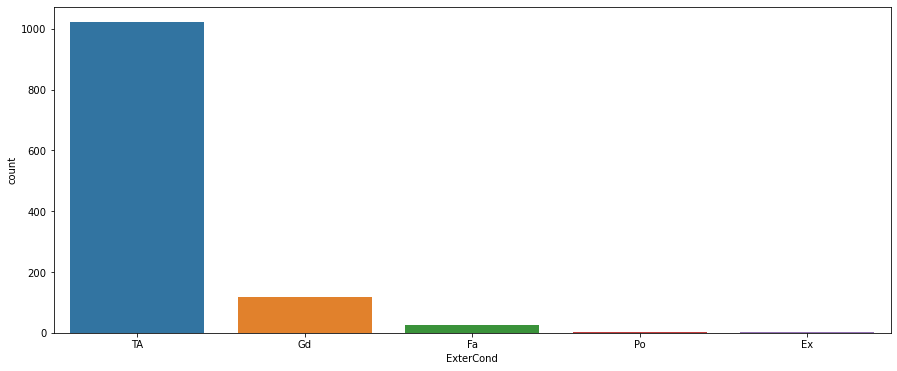

Value counts:

TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64


Percentage of data: 

TA    88.0
Gd    10.0
Fa     2.0
Ex     0.0
Po     0.0
Name: ExterCond, dtype: float64 2


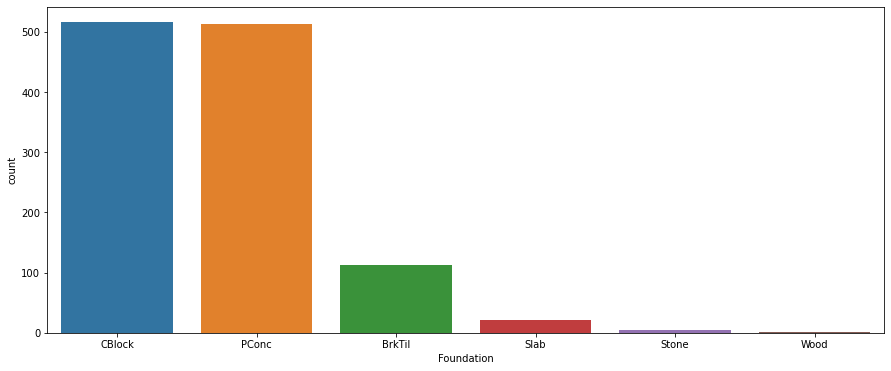

Value counts:

CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64


Percentage of data: 

CBlock    44.0
PConc     44.0
BrkTil    10.0
Slab       2.0
Stone      0.0
Wood       0.0
Name: Foundation, dtype: float64 2


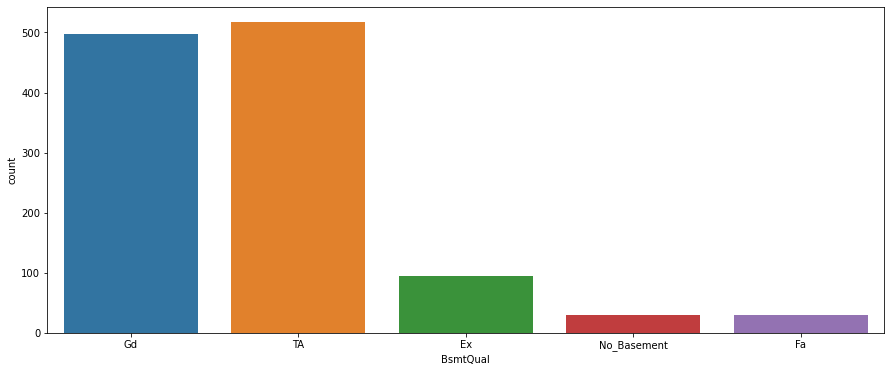

Value counts:

TA             517
Gd             498
Ex              94
No_Basement     30
Fa              29
Name: BsmtQual, dtype: int64


Percentage of data: 

TA             44.0
Gd             43.0
Ex              8.0
No_Basement     3.0
Fa              2.0
Name: BsmtQual, dtype: float64 2


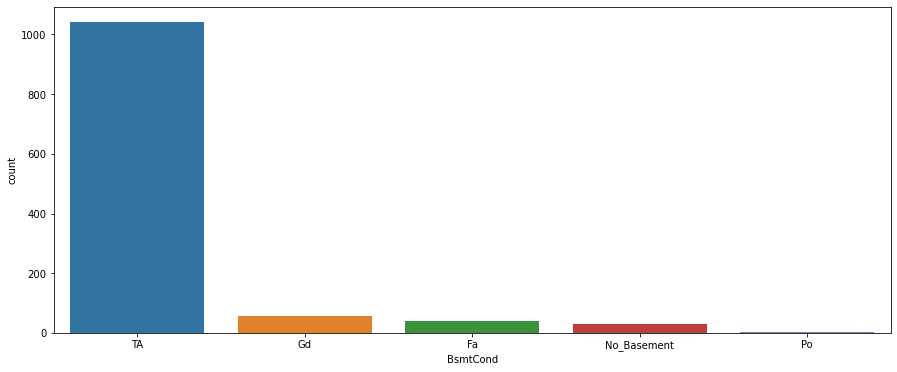

Value counts:

TA             1041
Gd               56
Fa               39
No_Basement      30
Po                2
Name: BsmtCond, dtype: int64


Percentage of data: 

TA             89.0
Gd              5.0
Fa              3.0
No_Basement     3.0
Po              0.0
Name: BsmtCond, dtype: float64 2


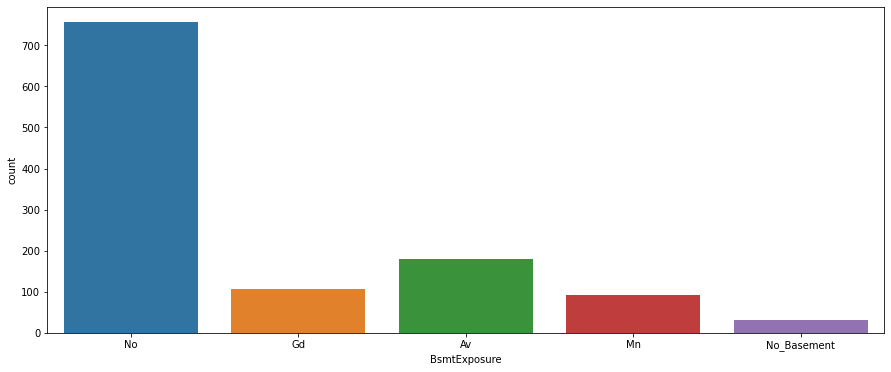

Value counts:

No             756
Av             180
Gd             108
Mn              93
No_Basement     31
Name: BsmtExposure, dtype: int64


Percentage of data: 

No             65.0
Av             15.0
Gd              9.0
Mn              8.0
No_Basement     3.0
Name: BsmtExposure, dtype: float64 2


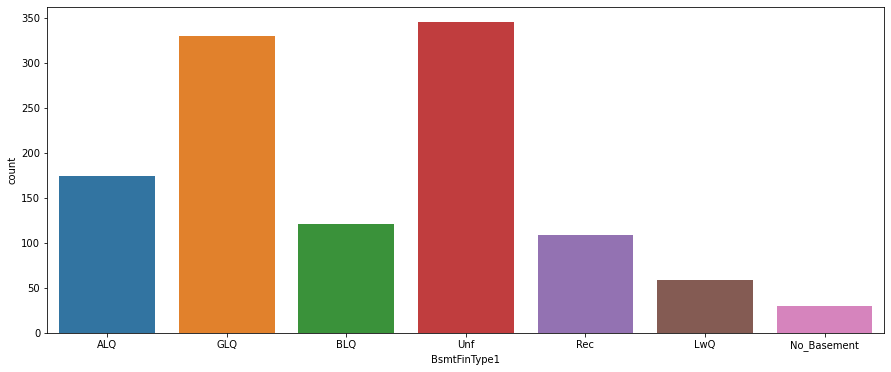

Value counts:

Unf            345
GLQ            330
ALQ            174
BLQ            121
Rec            109
LwQ             59
No_Basement     30
Name: BsmtFinType1, dtype: int64


Percentage of data: 

Unf            30.0
GLQ            28.0
ALQ            15.0
BLQ            10.0
Rec             9.0
LwQ             5.0
No_Basement     3.0
Name: BsmtFinType1, dtype: float64 2


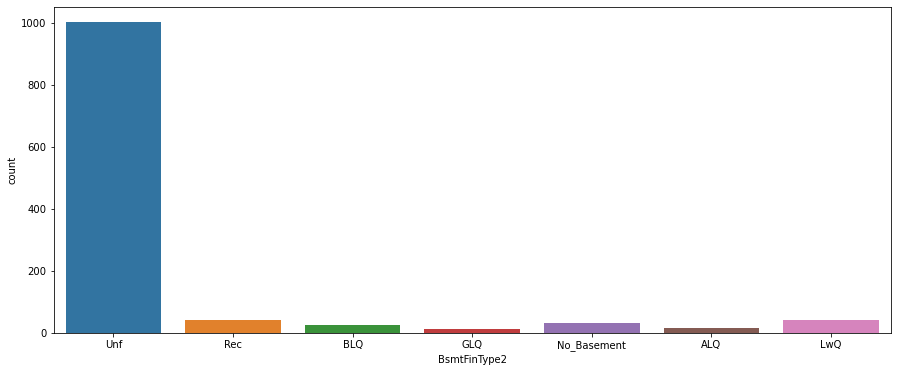

Value counts:

Unf            1002
Rec              43
LwQ              40
No_Basement      31
BLQ              24
ALQ              16
GLQ              12
Name: BsmtFinType2, dtype: int64


Percentage of data: 

Unf            86.0
Rec             4.0
LwQ             3.0
No_Basement     3.0
BLQ             2.0
ALQ             1.0
GLQ             1.0
Name: BsmtFinType2, dtype: float64 2


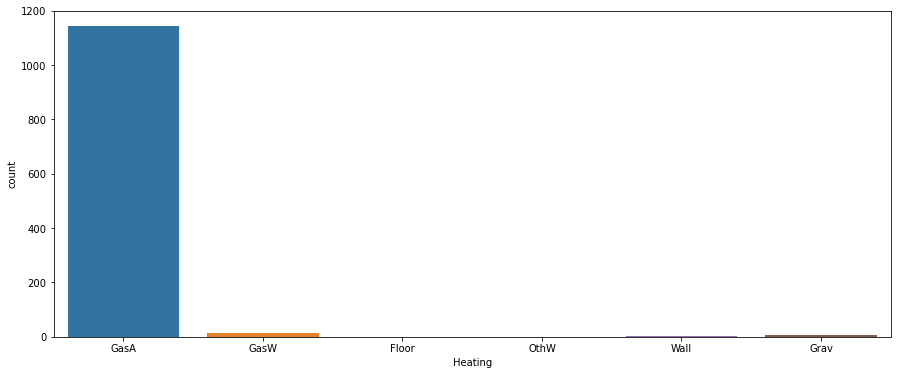

Value counts:

GasA     1143
GasW       14
Grav        5
Wall        4
OthW        1
Floor       1
Name: Heating, dtype: int64


Percentage of data: 

GasA     98.0
GasW      1.0
Grav      0.0
Wall      0.0
OthW      0.0
Floor     0.0
Name: Heating, dtype: float64 2


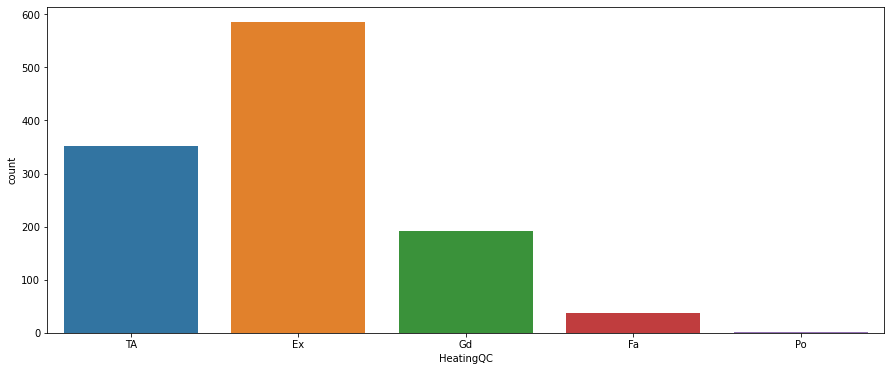

Value counts:

Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64


Percentage of data: 

Ex    50.0
TA    30.0
Gd    16.0
Fa     3.0
Po     0.0
Name: HeatingQC, dtype: float64 2


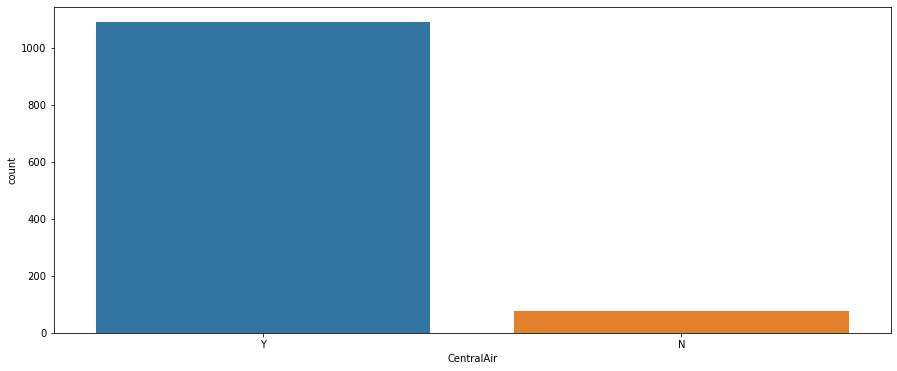

Value counts:

Y    1090
N      78
Name: CentralAir, dtype: int64


Percentage of data: 

Y    93.0
N     7.0
Name: CentralAir, dtype: float64 2


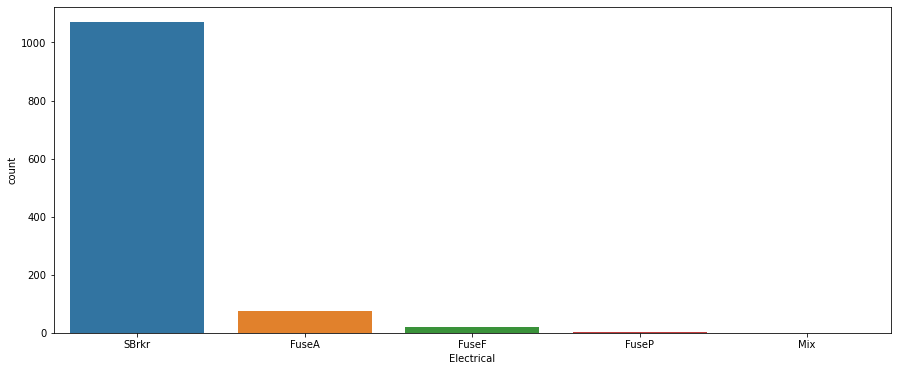

Value counts:

SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64


Percentage of data: 

SBrkr    92.0
FuseA     6.0
FuseF     2.0
FuseP     0.0
Mix       0.0
Name: Electrical, dtype: float64 2


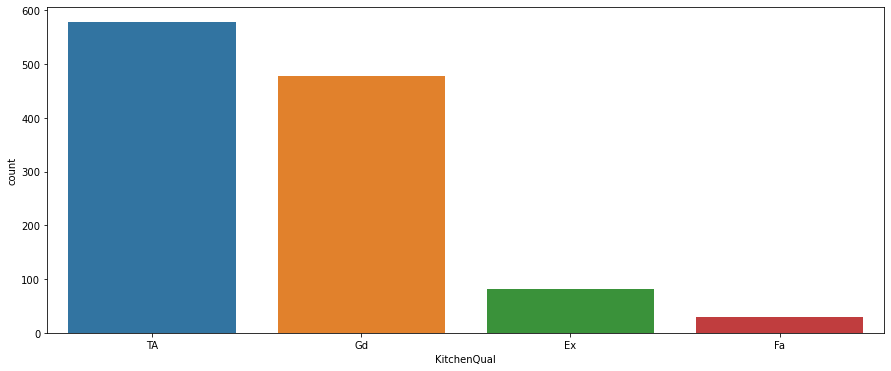

Value counts:

TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64


Percentage of data: 

TA    49.0
Gd    41.0
Ex     7.0
Fa     3.0
Name: KitchenQual, dtype: float64 2


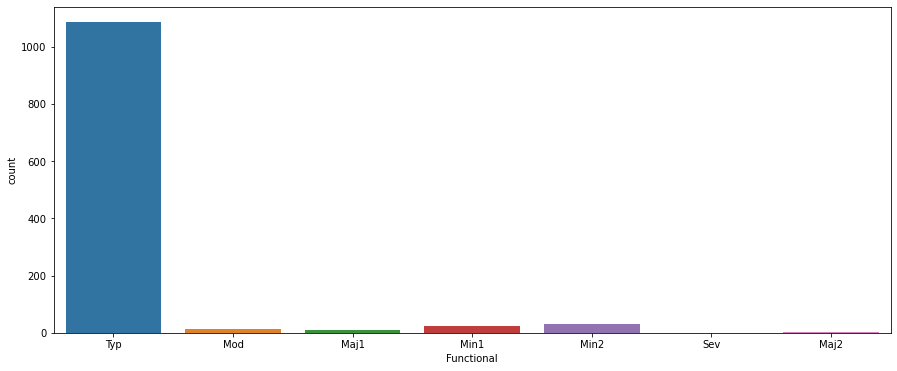

Value counts:

Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64


Percentage of data: 

Typ     93.0
Min2     3.0
Min1     2.0
Mod      1.0
Maj1     1.0
Maj2     0.0
Sev      0.0
Name: Functional, dtype: float64 2


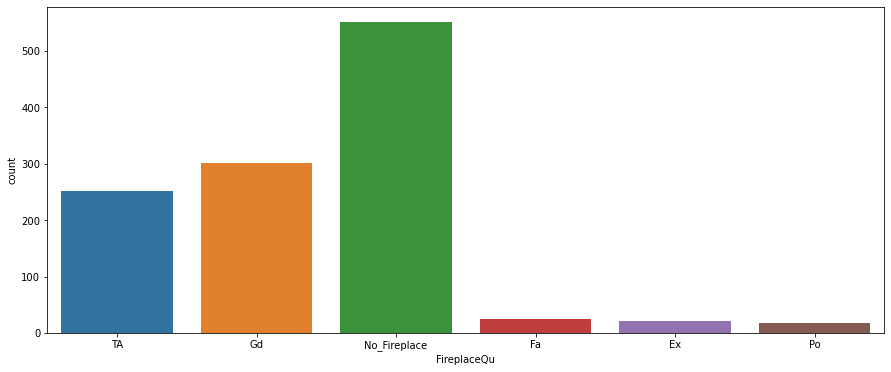

Value counts:

No_Fireplace    551
Gd              301
TA              252
Fa               25
Ex               21
Po               18
Name: FireplaceQu, dtype: int64


Percentage of data: 

No_Fireplace    47.0
Gd              26.0
TA              22.0
Fa               2.0
Ex               2.0
Po               2.0
Name: FireplaceQu, dtype: float64 2


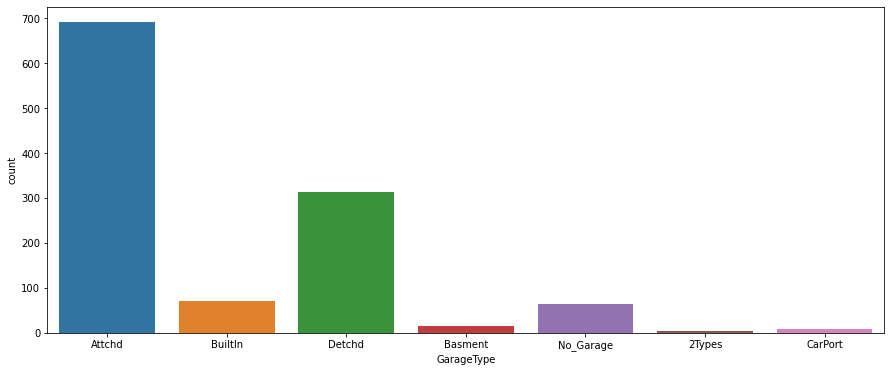

Value counts:

Attchd       691
Detchd       314
BuiltIn       70
No_Garage     64
Basment       16
CarPort        8
2Types         5
Name: GarageType, dtype: int64


Percentage of data: 

Attchd       59.0
Detchd       27.0
BuiltIn       6.0
No_Garage     5.0
Basment       1.0
CarPort       1.0
2Types        0.0
Name: GarageType, dtype: float64 2


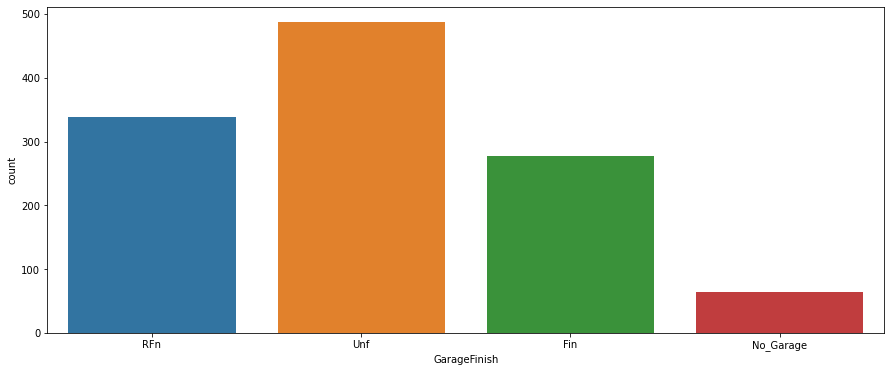

Value counts:

Unf          487
RFn          339
Fin          278
No_Garage     64
Name: GarageFinish, dtype: int64


Percentage of data: 

Unf          42.0
RFn          29.0
Fin          24.0
No_Garage     5.0
Name: GarageFinish, dtype: float64 2


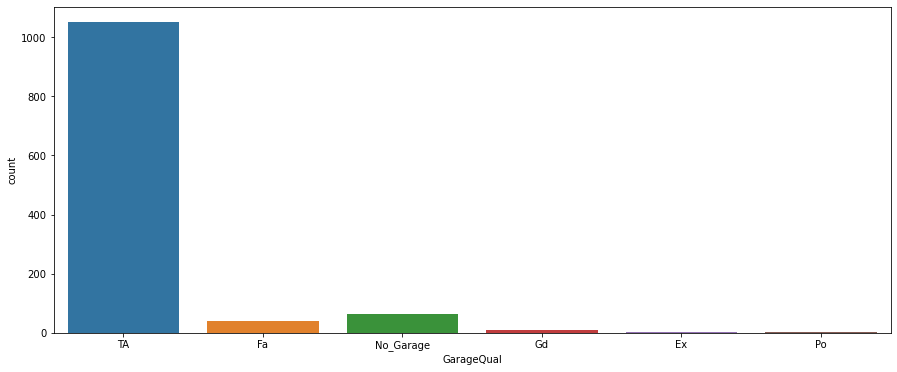

Value counts:

TA           1050
No_Garage      64
Fa             39
Gd             11
Po              2
Ex              2
Name: GarageQual, dtype: int64


Percentage of data: 

TA           90.0
No_Garage     5.0
Fa            3.0
Gd            1.0
Po            0.0
Ex            0.0
Name: GarageQual, dtype: float64 2


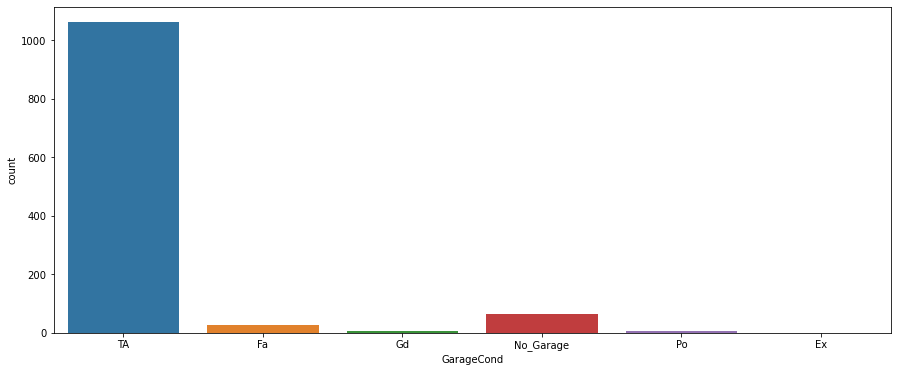

Value counts:

TA           1061
No_Garage      64
Fa             28
Gd              8
Po              6
Ex              1
Name: GarageCond, dtype: int64


Percentage of data: 

TA           91.0
No_Garage     5.0
Fa            2.0
Gd            1.0
Po            1.0
Ex            0.0
Name: GarageCond, dtype: float64 2


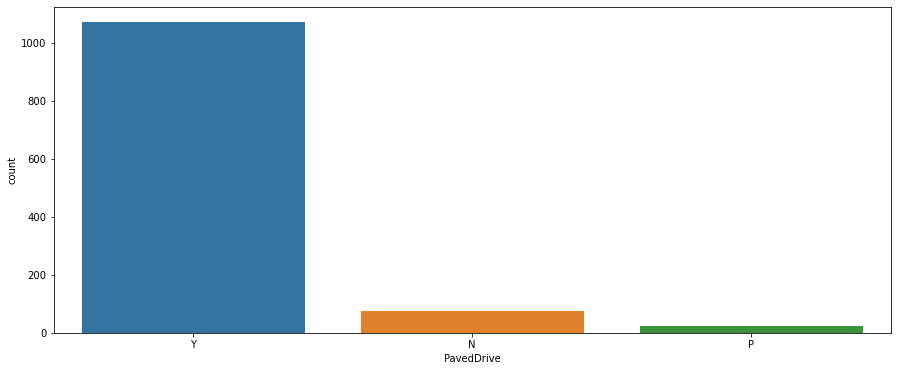

Value counts:

Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64


Percentage of data: 

Y    92.0
N     6.0
P     2.0
Name: PavedDrive, dtype: float64 2


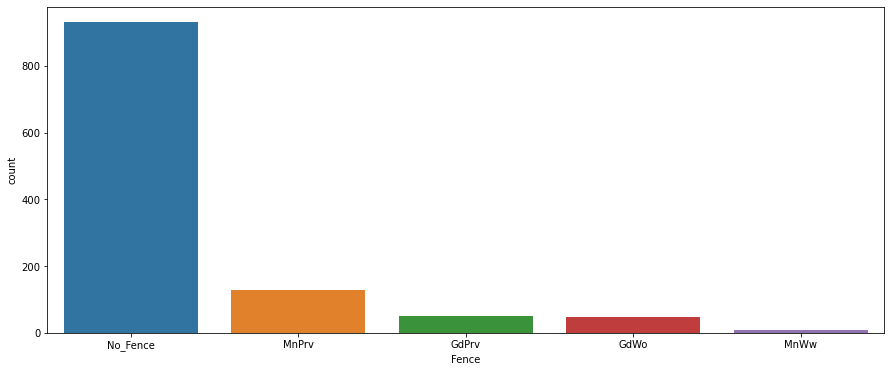

Value counts:

No_Fence    931
MnPrv       129
GdPrv        51
GdWo         47
MnWw         10
Name: Fence, dtype: int64


Percentage of data: 

No_Fence    80.0
MnPrv       11.0
GdPrv        4.0
GdWo         4.0
MnWw         1.0
Name: Fence, dtype: float64 2


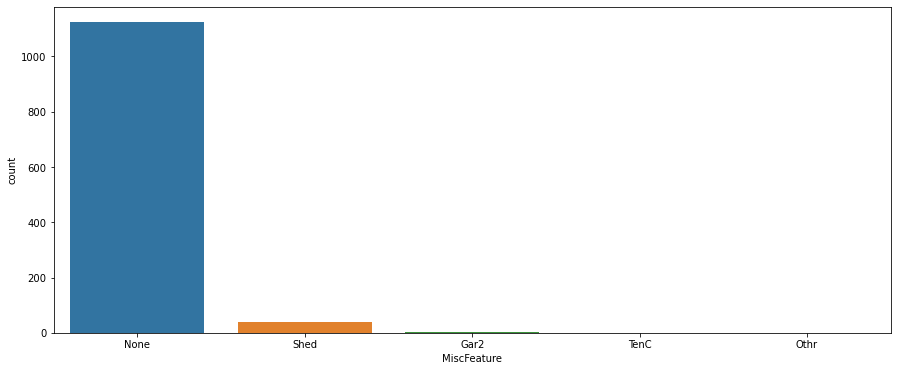

Value counts:

None    1124
Shed      40
Gar2       2
TenC       1
Othr       1
Name: MiscFeature, dtype: int64


Percentage of data: 

None    96.0
Shed     3.0
Gar2     0.0
TenC     0.0
Othr     0.0
Name: MiscFeature, dtype: float64 2


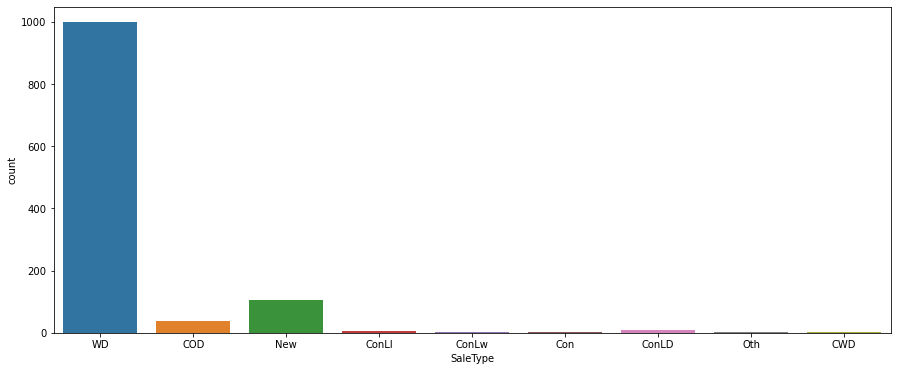

Value counts:

WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
Oth        3
CWD        3
Con        2
Name: SaleType, dtype: int64


Percentage of data: 

WD       86.0
New       9.0
COD       3.0
ConLD     1.0
ConLI     0.0
ConLw     0.0
Oth       0.0
CWD       0.0
Con       0.0
Name: SaleType, dtype: float64 2


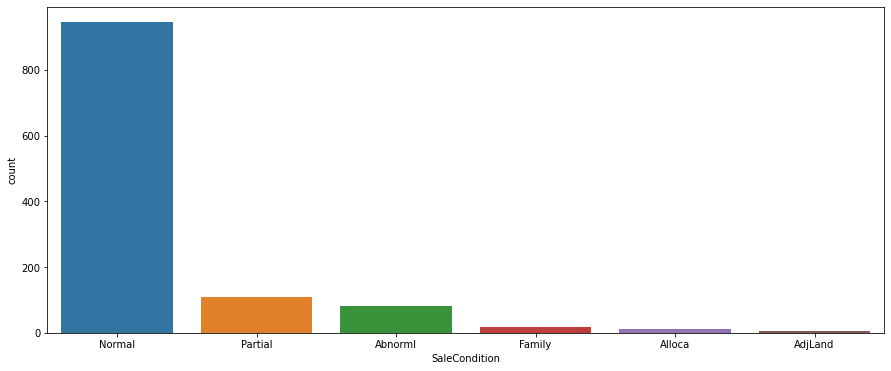

Value counts:

Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64


Percentage of data: 

Normal     81.0
Partial     9.0
Abnorml     7.0
Family      2.0
Alloca      1.0
AdjLand     0.0
Name: SaleCondition, dtype: float64 2


In [32]:
#Plotting countplot for each categorical data
for i in categorical:
    plt.figure(figsize=(15,6))
    sns.countplot(df[i])
    plt.show()
    
#Checking value counts and percentage of data classification in each string attribute
    print("Value counts:\n")
    print(df[i].value_counts())
    print('\n')
    print("Percentage of data: \n")
    print(round(df[i].value_counts()/1168*100),2)  #1168 is the entire data

In [33]:
#Taking all continuous data and analyzing it
cont=[x for x in df.columns if x not in categorical]

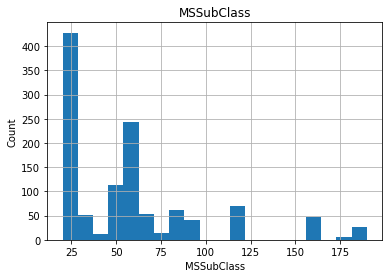

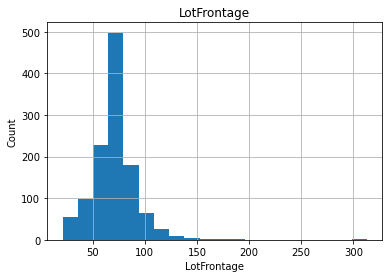

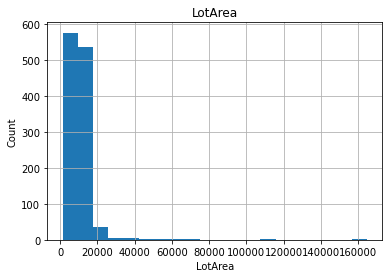

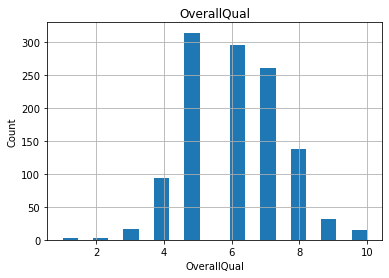

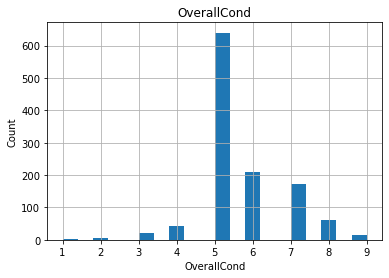

...

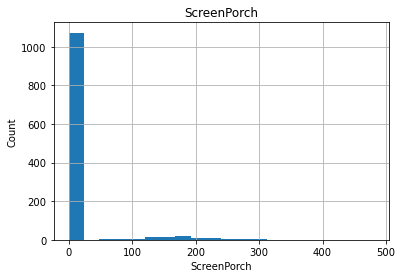

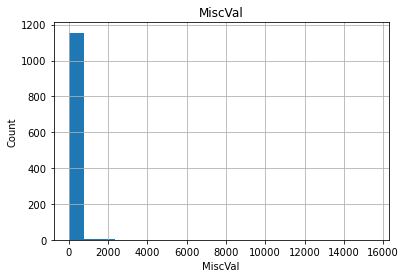

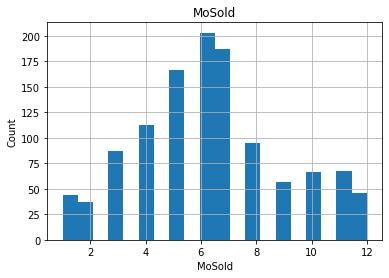

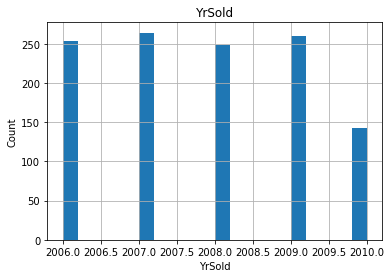

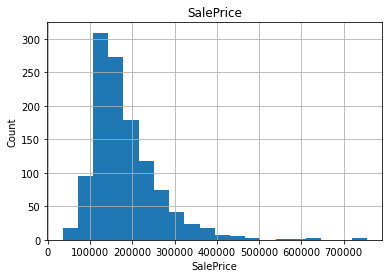

In [34]:
#visualizing each continuous features using histogram
for i in cont:
    data=df.copy()
    data[i].hist(bins=20)
    plt.xlabel(i)
    plt.ylabel("Count")
    plt.title(i)
    plt.show()

# Bivariate Analysis

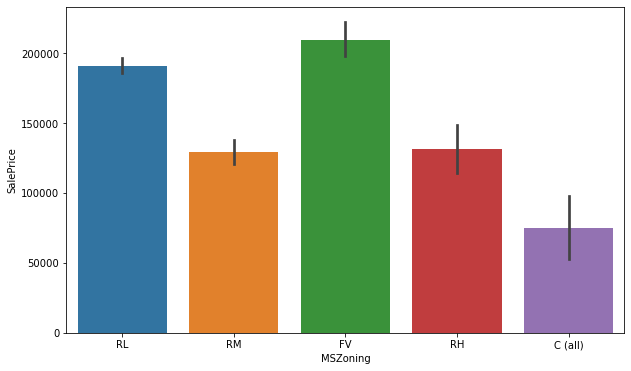

MSZoning
C (all)     75208.888889
FV         209478.461538
RH         131558.375000
RL         191004.181034
RM         129070.975460
Name: SalePrice, dtype: float64


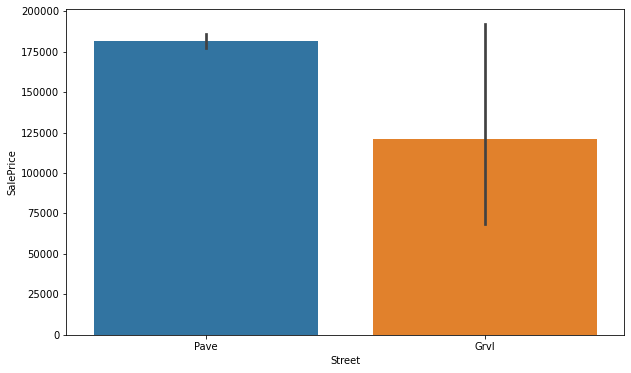

Street
Grvl    121110.750000
Pave    181684.450172
Name: SalePrice, dtype: float64


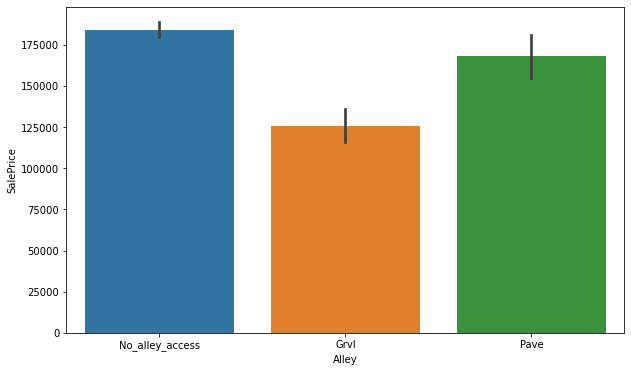

Alley
Grvl               125511.073171
No_alley_access    184016.191567
Pave               168264.555556
Name: SalePrice, dtype: float64


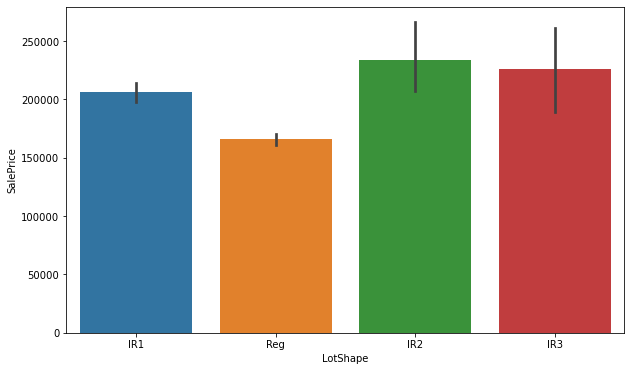

LotShape
IR1    206038.464103
IR2    233827.750000
IR3    226120.833333
Reg    165906.660811
Name: SalePrice, dtype: float64


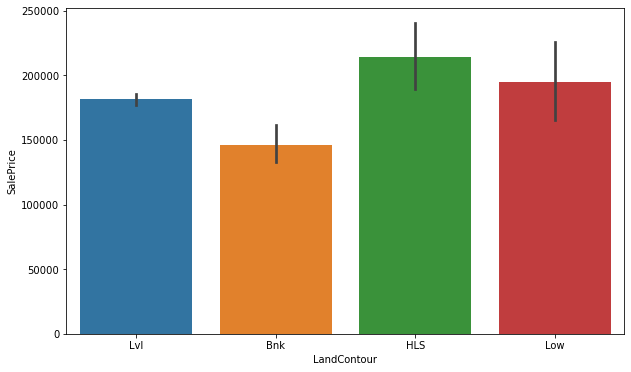

LandContour
Bnk    146163.140000
HLS    214302.166667
Low    194393.333333
Lvl    181476.572658
Name: SalePrice, dtype: float64


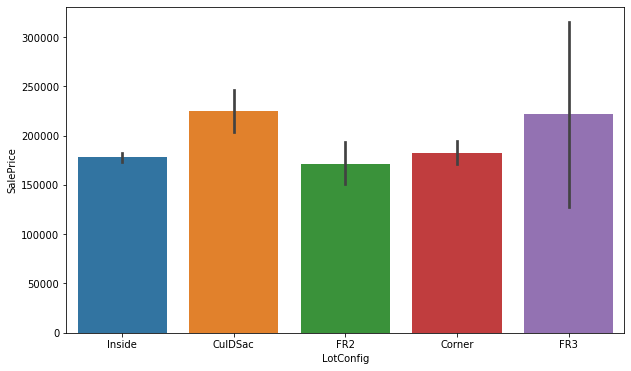

LotConfig
Corner     182427.635135
CulDSac    224594.463768
FR2        171138.636364
FR3        221500.000000
Inside     178003.105701
Name: SalePrice, dtype: float64


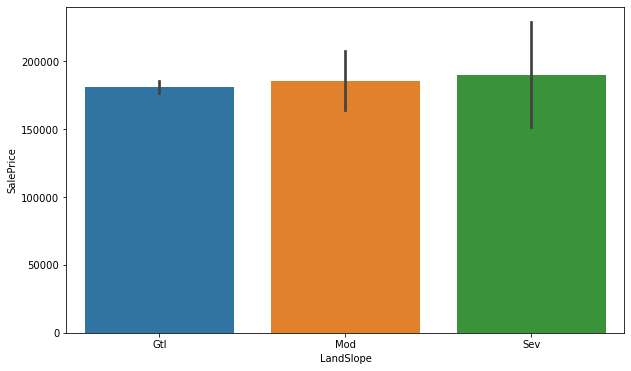

LandSlope
Gtl    181203.795475
Mod    185353.313725
Sev    190160.833333
Name: SalePrice, dtype: float64


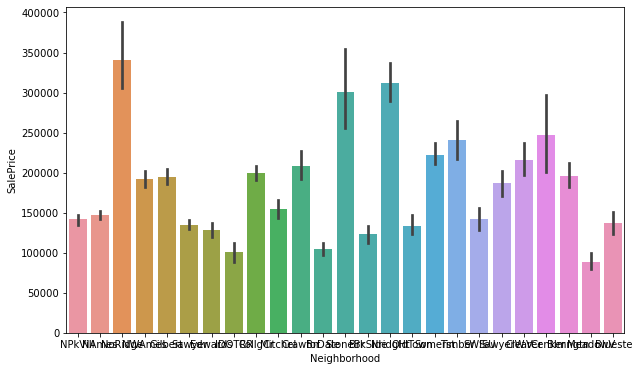

Neighborhood
Blmngtn    195987.000000
Blueste    137500.000000
BrDale     104081.818182
BrkSide    122836.000000
ClearCr    216120.833333
CollgCr    199517.508475
Crawfor    208474.688889
Edwards    128544.216867
Gilbert    194790.093750
IDOTRR     101322.666667
MeadowV     88444.444444
Mitchel    154654.411765
NAmes      146511.225275
NPkVill    141968.750000
NWAmes     191643.305085
NoRidge    341260.228571
NridgHt    312548.655738
OldTown    133947.197674
SWISU      142587.333333
Sawyer     135029.866667
SawyerW    186909.647059
Somerst    222649.588235
StoneBr    301145.736842
Timber     240579.291667
Veenker    246833.333333
Name: SalePrice, dtype: float64


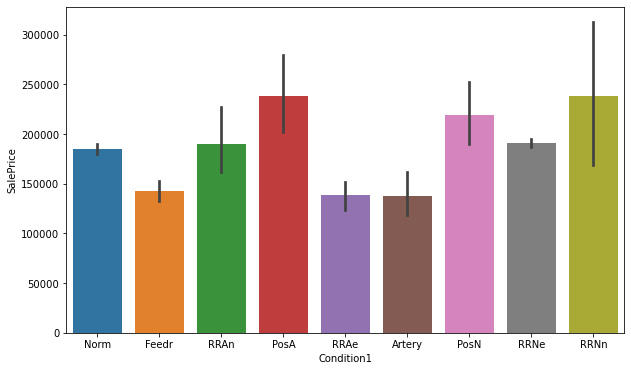

Condition1
Artery    137926.315789
Feedr     142799.731343
Norm      184692.003980
PosA      237833.333333
PosN      219264.705882
RRAe      139044.444444
RRAn      190074.850000
RRNe      190750.000000
RRNn      238000.000000
Name: SalePrice, dtype: float64


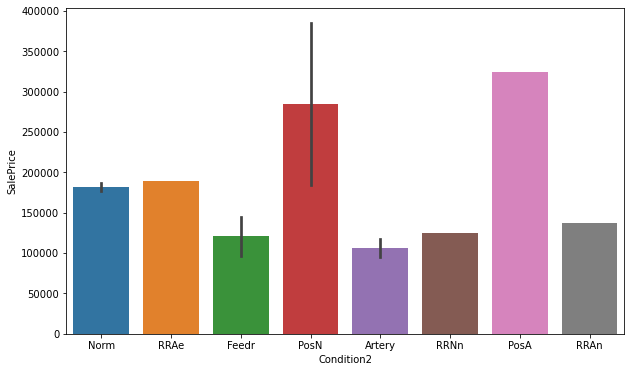

Condition2
Artery    106500.000000
Feedr     121166.666667
Norm      181697.129983
PosA      325000.000000
PosN      284875.000000
RRAe      190000.000000
RRAn      136905.000000
RRNn      125000.000000
Name: SalePrice, dtype: float64


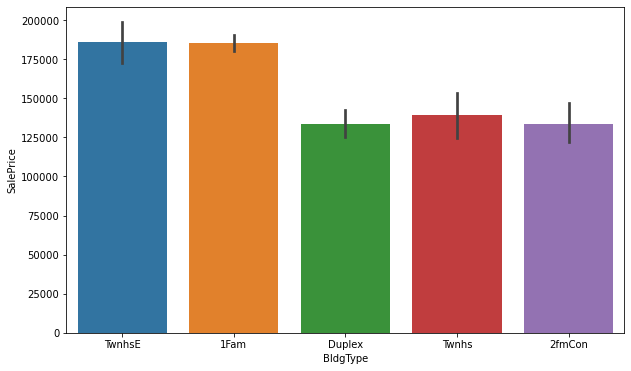

BldgType
1Fam      185602.300714
2fmCon    133737.037037
Duplex    133871.609756
Twnhs     139437.931034
TwnhsE    186066.111111
Name: SalePrice, dtype: float64


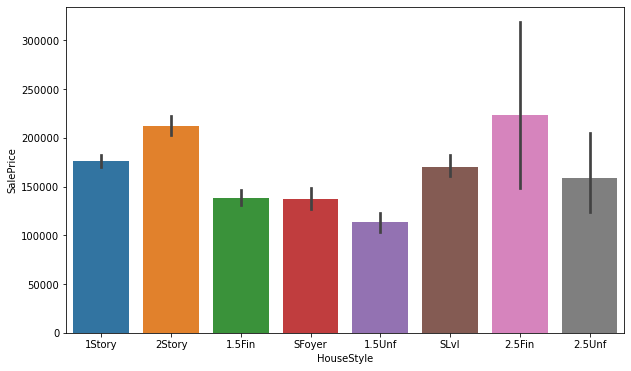

HouseStyle
1.5Fin    138546.363636
1.5Unf    113216.666667
1Story    175940.826990
2.5Fin    223285.714286
2.5Unf    158690.000000
2Story    212193.515235
SFoyer    137508.000000
SLvl      170140.851064
Name: SalePrice, dtype: float64


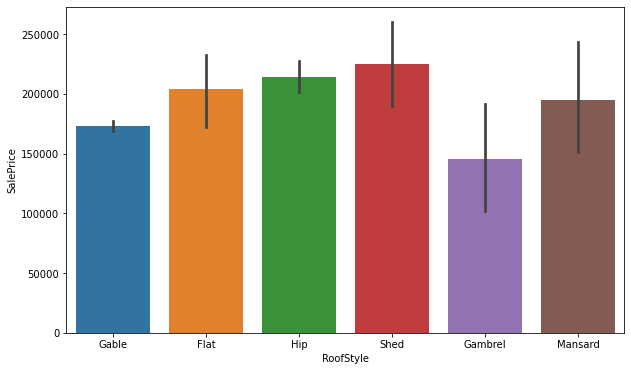

RoofStyle
Flat       204080.833333
Gable      173251.570492
Gambrel    145111.111111
Hip        214493.364444
Mansard    194795.800000
Shed       225000.000000
Name: SalePrice, dtype: float64


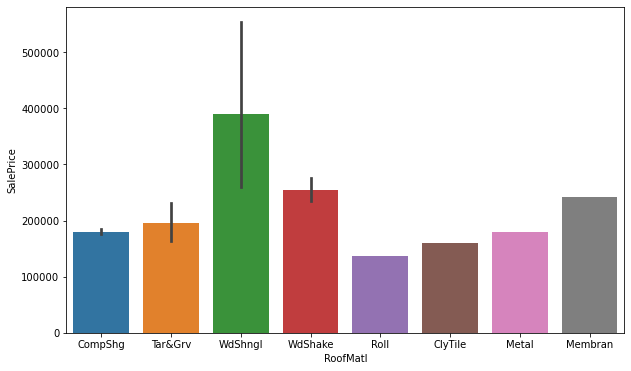

RoofMatl
ClyTile    160000.000000
CompShg    180009.329545
Membran    241500.000000
Metal      180000.000000
Roll       137000.000000
Tar&Grv    195747.000000
WdShake    254250.000000
WdShngl    390250.000000
Name: SalePrice, dtype: float64


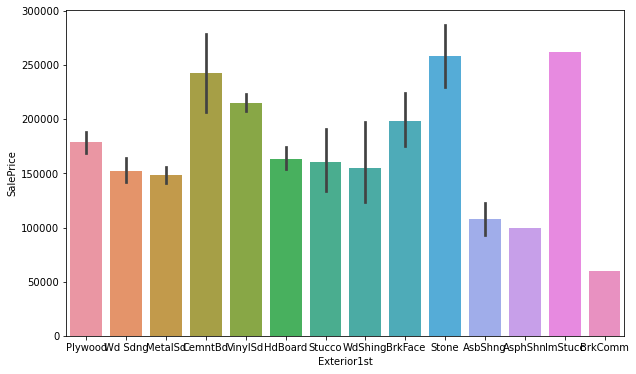

Exterior1st
AsbShng    107774.263158
AsphShn    100000.000000
BrkComm     60000.000000
BrkFace    198391.463415
CemntBd    242928.476190
HdBoard    163432.648045
ImStucc    262000.000000
MetalSd    148498.196629
Plywood    178890.075269
Stone      258500.000000
Stucco     160602.272727
VinylSd    215359.676768
Wd Sdng    152572.724138
WdShing    155481.578947
Name: SalePrice, dtype: float64


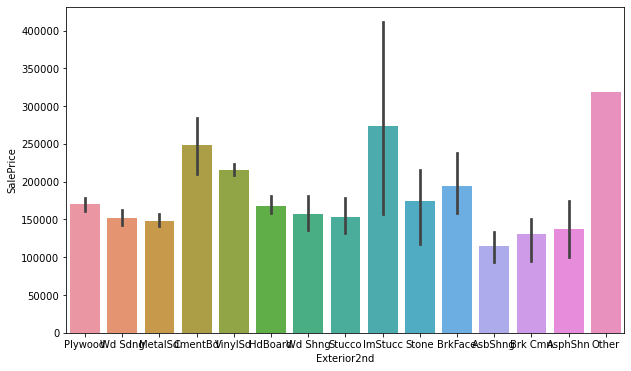

Exterior2nd
AsbShng    114372.833333
AsphShn    138000.000000
Brk Cmn    131300.000000
BrkFace    194772.500000
CmentBd    247940.380952
HdBoard    168398.200000
ImStucc    273712.500000
MetalSd    148570.398844
Other      319000.000000
Plywood    169979.042373
Stone      174406.000000
Stucco     153066.695652
VinylSd    215607.100775
Wd Sdng    152218.969697
Wd Shng    156650.000000
Name: SalePrice, dtype: float64


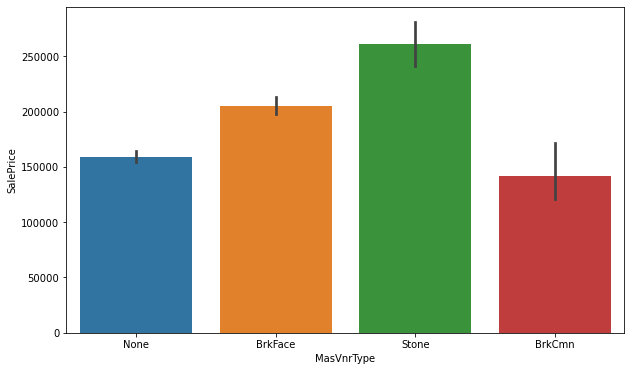

MasVnrType
BrkCmn     141990.076923
BrkFace    205275.432203
None       159079.399716
Stone      261417.867347
Name: SalePrice, dtype: float64


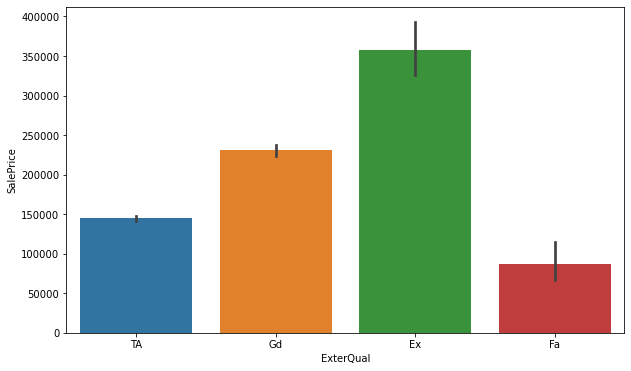

ExterQual
Ex    357817.651163
Fa     87435.727273
Gd    231009.743073
TA    144918.163180
Name: SalePrice, dtype: float64


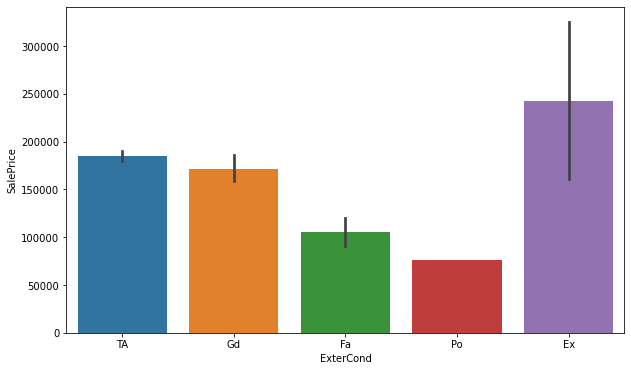

ExterCond
Ex    243000.000000
Fa    105294.769231
Gd    171391.837607
Po     76500.000000
TA    184551.990215
Name: SalePrice, dtype: float64


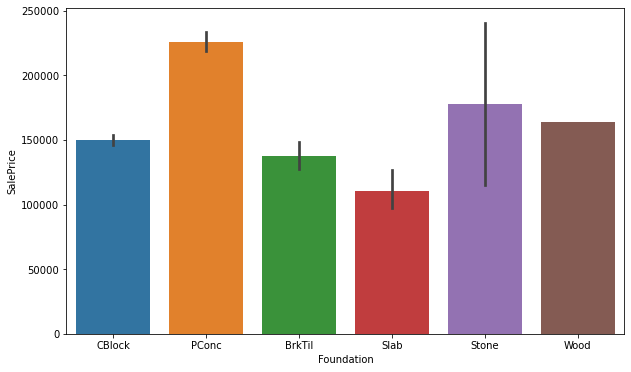

Foundation
BrkTil    137895.285714
CBlock    149858.994186
PConc     225757.504873
Slab      110846.428571
Stone     177651.000000
Wood      164000.000000
Name: SalePrice, dtype: float64


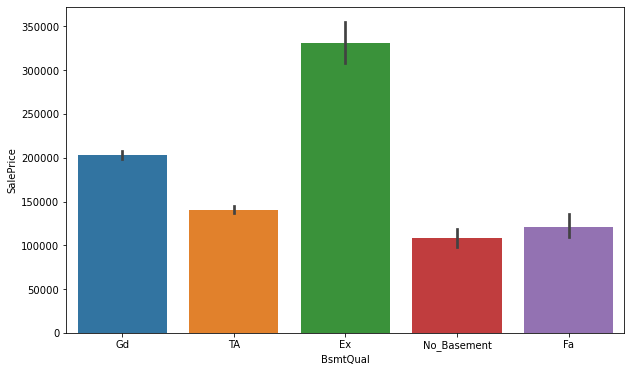

BsmtQual
Ex             331469.978723
Fa             121349.000000
Gd             203225.445783
No_Basement    107897.500000
TA             140898.736944
Name: SalePrice, dtype: float64


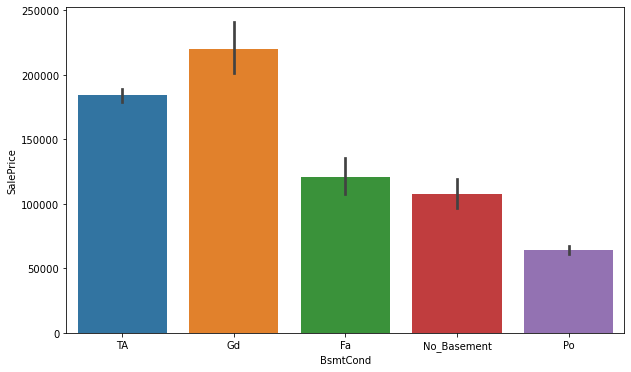

BsmtCond
Fa             121075.102564
Gd             219908.107143
No_Basement    107897.500000
Po              64000.000000
TA             184018.669549
Name: SalePrice, dtype: float64


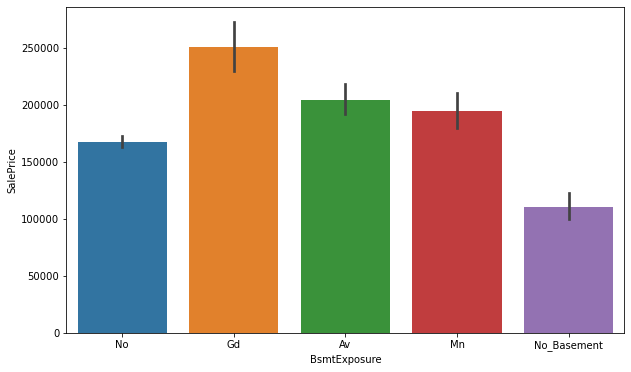

BsmtExposure
Av             204174.861111
Gd             250581.138889
Mn             194213.838710
No             167539.144180
No_Basement    110626.612903
Name: SalePrice, dtype: float64


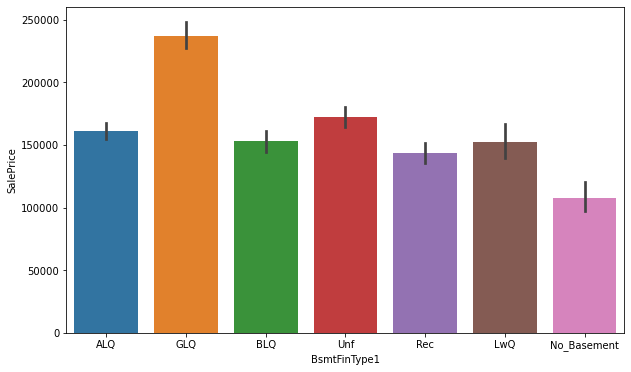

BsmtFinType1
ALQ            161003.879310
BLQ            152803.396694
GLQ            236871.596970
LwQ            152712.711864
No_Basement    107897.500000
Rec            143592.844037
Unf            172159.521739
Name: SalePrice, dtype: float64


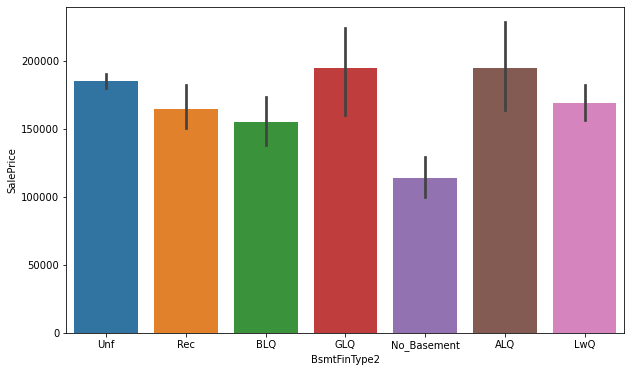

BsmtFinType2
ALQ            194712.500000
BLQ            154815.958333
GLQ            194937.500000
LwQ            168846.250000
No_Basement    113578.225806
Rec            164477.325581
Unf            185077.455090
Name: SalePrice, dtype: float64


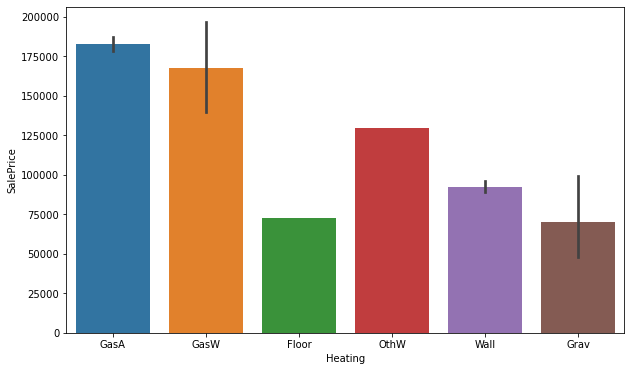

Heating
Floor     72500.000000
GasA     182591.394576
GasW     167312.785714
Grav      70080.000000
OthW     129500.000000
Wall      92100.000000
Name: SalePrice, dtype: float64


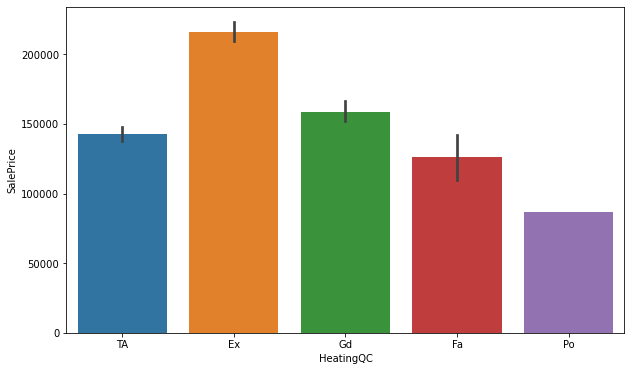

HeatingQC
Ex    215954.223932
Fa    126556.710526
Gd    158909.833333
Po     87000.000000
TA    142684.883523
Name: SalePrice, dtype: float64


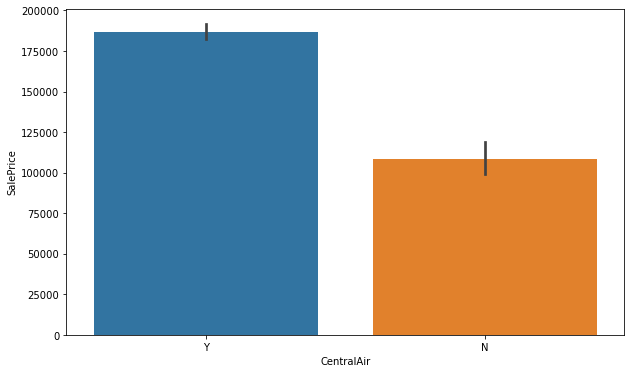

CentralAir
N    108539.576923
Y    186696.381651
Name: SalePrice, dtype: float64


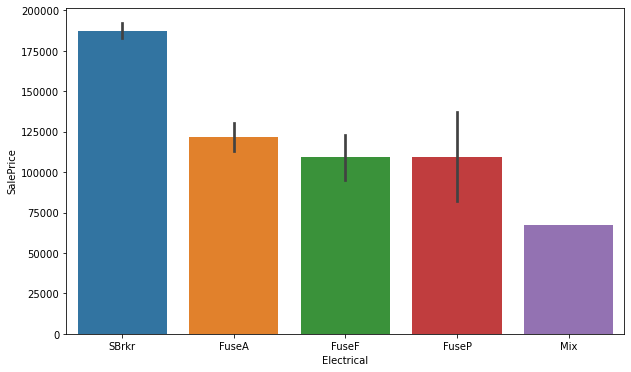

Electrical
FuseA    121840.986486
FuseF    109611.285714
FuseP    109500.000000
Mix       67000.000000
SBrkr    187253.339252
Name: SalePrice, dtype: float64


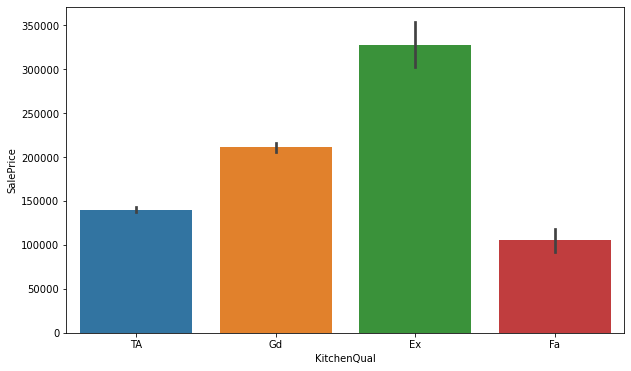

KitchenQual
Ex    327812.329268
Fa    105028.100000
Gd    211076.234310
TA    140206.313149
Name: SalePrice, dtype: float64


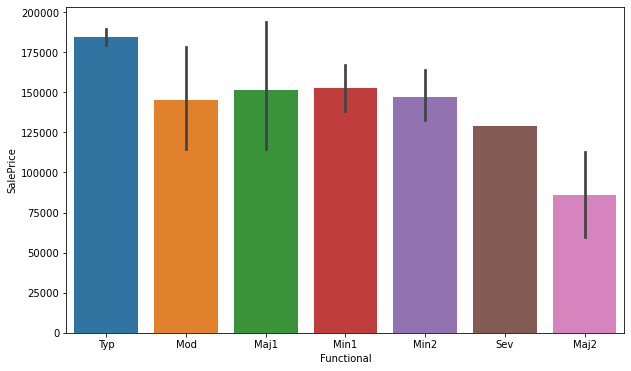

Functional
Maj1    151443.090909
Maj2     86000.000000
Min1    152630.000000
Min2    146841.666667
Mod     145241.666667
Sev     129000.000000
Typ     184204.948387
Name: SalePrice, dtype: float64


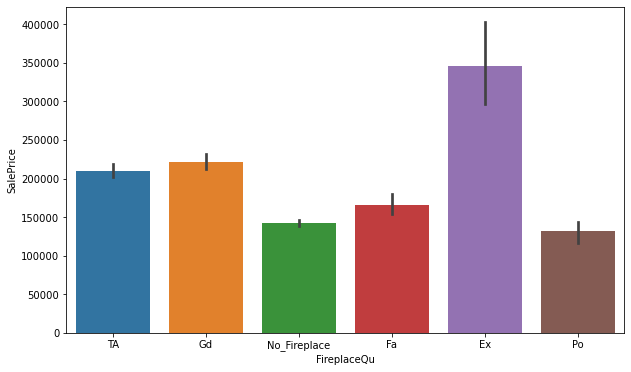

FireplaceQu
Ex              346091.142857
Fa              166214.000000
Gd              221925.581395
No_Fireplace    142411.822142
Po              131487.944444
TA              209946.753968
Name: SalePrice, dtype: float64


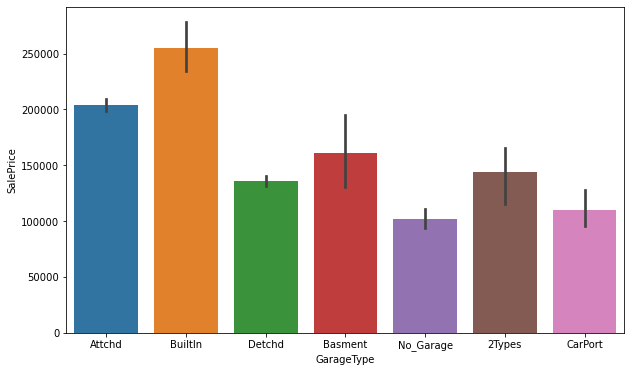

GarageType
2Types       144200.000000
Attchd       203675.839363
Basment      160708.937500
BuiltIn      254970.900000
CarPort      109957.375000
Detchd       135873.799363
No_Garage    102200.000000
Name: SalePrice, dtype: float64


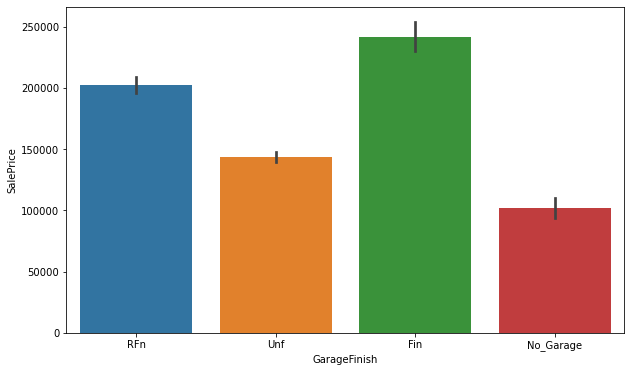

GarageFinish
Fin          241223.809353
No_Garage    102200.000000
RFn          201925.554572
Unf          143555.156057
Name: SalePrice, dtype: float64


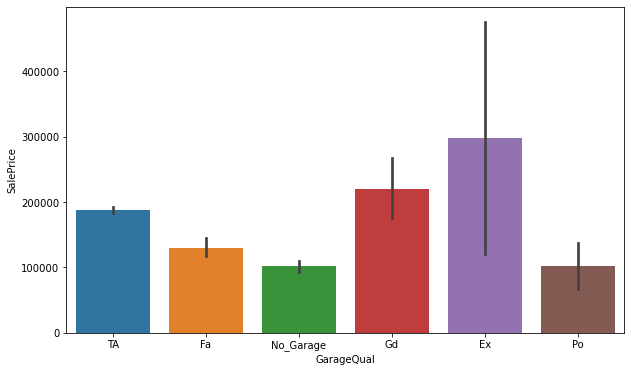

GarageQual
Ex           297750.000000
Fa           129889.000000
Gd           219822.727273
No_Garage    102200.000000
Po           102000.000000
TA           187753.449524
Name: SalePrice, dtype: float64


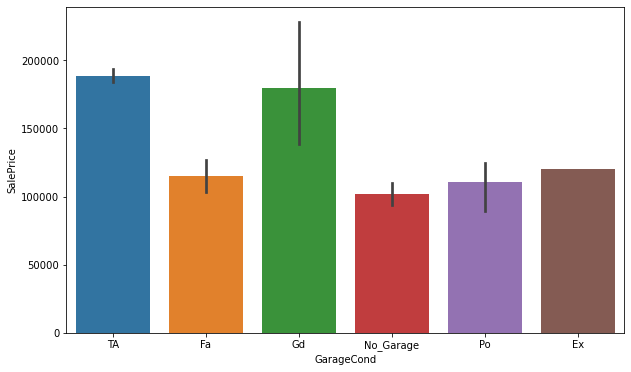

GarageCond
Ex           120500.000000
Fa           115031.821429
Gd           179921.250000
No_Garage    102200.000000
Po           110500.000000
TA           188483.112158
Name: SalePrice, dtype: float64


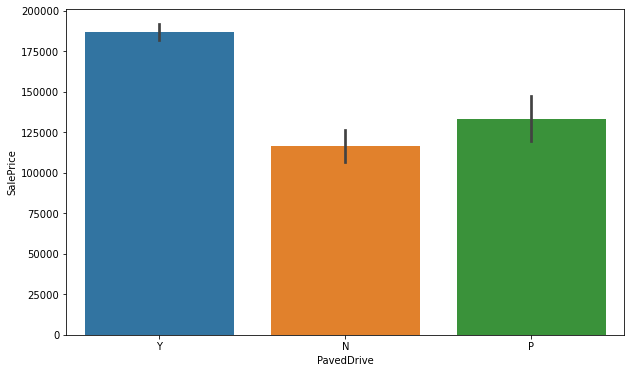

PavedDrive
N    116421.472973
P    133326.086957
Y    187006.026144
Name: SalePrice, dtype: float64


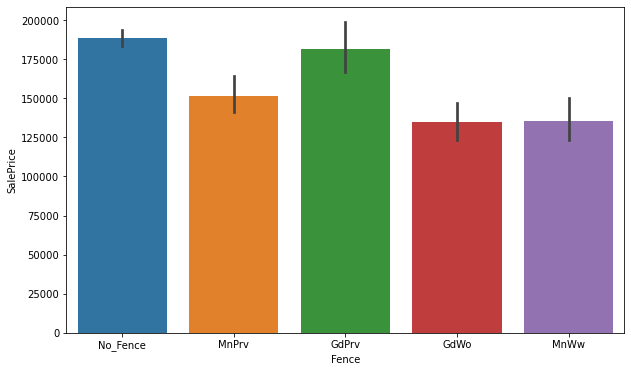

Fence
GdPrv       181743.529412
GdWo        134593.255319
MnPrv       151392.798450
MnWw        135715.000000
No_Fence    188489.279270
Name: SalePrice, dtype: float64


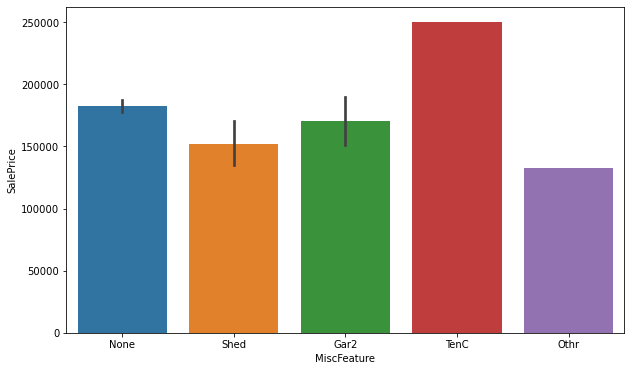

MiscFeature
Gar2    170750.000000
None    182541.548043
Othr    133000.000000
Shed    151598.575000
TenC    250000.000000
Name: SalePrice, dtype: float64


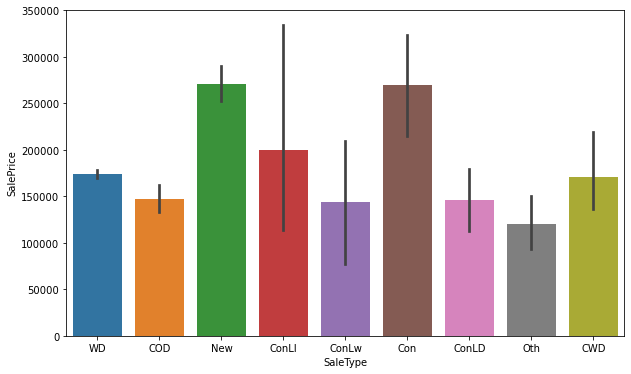

SaleType
COD      146722.368421
CWD      171166.666667
Con      269600.000000
ConLD    146141.000000
ConLI    200390.000000
ConLw    143625.000000
New      271104.500000
Oth      119850.000000
WD       173668.456456
Name: SalePrice, dtype: float64


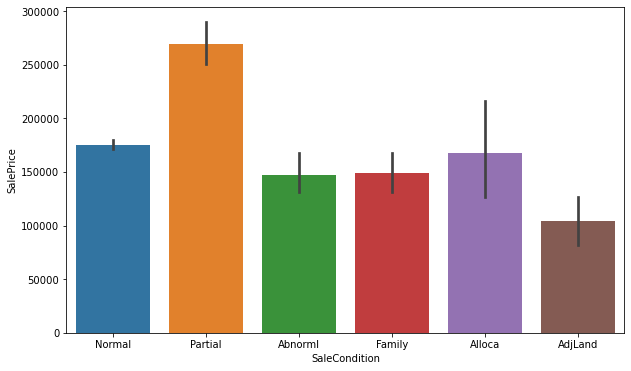

SaleCondition
Abnorml    147567.938272
AdjLand    104125.000000
Alloca     167377.416667
Family     149138.888889
Normal     175436.408466
Partial    269585.231481
Name: SalePrice, dtype: float64


In [38]:
#Visualizing each categorical column wrt sale price
for i in categorical:
    plt.figure(figsize=(10,6))
    sns.barplot(x=df[i],y=df['SalePrice'])
    plt.show()
    print(df.groupby(df[i])['SalePrice'].mean())
#Calculating mean value of SalePrice

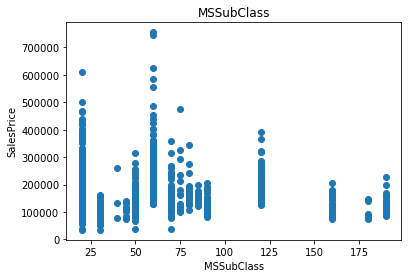

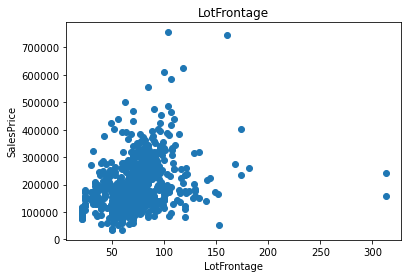

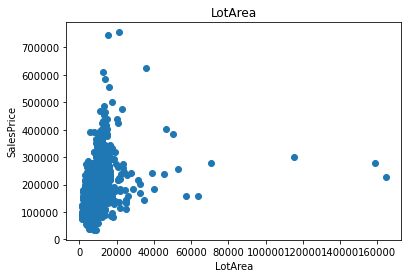

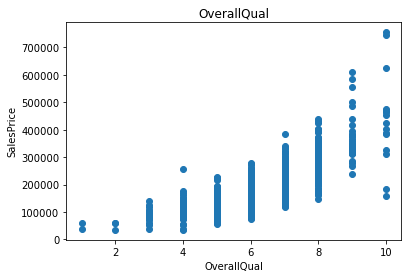

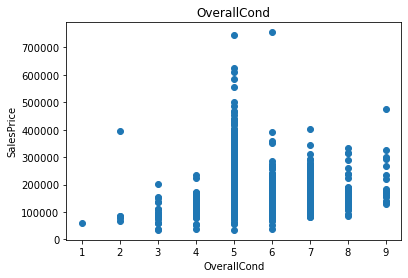

...

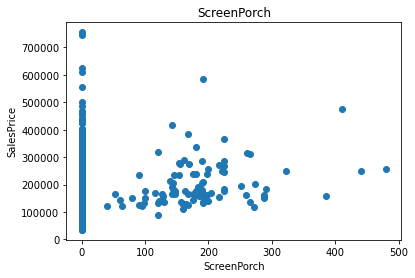

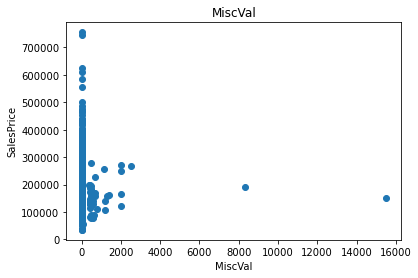

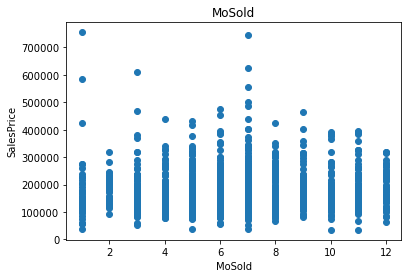

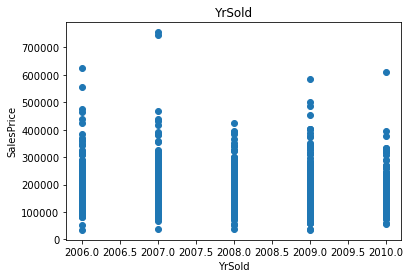

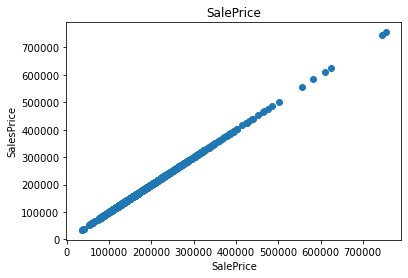

In [37]:
#Visualising sale price wrt to each continuous feature
for i in cont:
    plt.scatter(df[i],df['SalePrice'])
    plt.xlabel(i)
    plt.ylabel('SalesPrice')
    plt.title(i)
    plt.show()

Observations:
    
-> LotFrontage: Linear feet of street connected to property-: Lot frontage doed not impact much on sale price since houses with different sale price are having same Lot frontage area

-> LotArea: Lot size in square feet-: LotArea doesn't affect sale price of the houses much, as can be seen different sale price are availble within the Lot area range of 0 to 20000.In fact some houses where Lot Area is very large have moderate sale price

-> OverallQual: Rates the overall material and finish of the house-:Overall quality is directly proportional to the sale price of houses

-> YearBuilt: & YearRemodAdd: Houses which are build latest have high sale price in comparison to those build in early years.similar is the case with remodelling date

-> BsmtFinSF1: Type 1 finished square feet-:Total sq ft of basement area is directly proportional to sale price Houses with higher number of full bathrooms seems having high sale price

-> Kitchen: Kitchens above grade-:houses with 1 kitchen above ground have high sale price in comparison to those having 2 kitchens

-> Fireplaces: Number of fireplaces-:Houses with 1 and 2 fireplaces have higher prices in comparion to houses having 0 or 3 fireplaces

-> Wood deck,Enclosed porch,Three season porch, screen porch,pool area,Miscval do not have impact on sale price

# Multivariate Analysis¶


In [39]:
#Statistical summary of the dataset
df.describe()    

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.767979,70.807363,10484.749144,6.104452,5.595890,1970.930651,1984.758562,101.696918,444.726027,46.647260,569.721747,1061.095034,1169.860445,348.826199,6.380137,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1976.287671,1.776541,476.860445,96.206336,46.559932,23.015411,3.639555,15.051370,47.315068,6.344178,2007.804795,181477.005993
std,41.940650,22.440317,8957.442311,1.390153,1.124343,30.145255,20.785185,182.218483,462.664785,163.520016,449.375525,442.272249,391.161983,439.696370,50.892844,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,26.376864,0.745554,214.466769,126.158988,66.381023,63.191089,29.088867,55.080816,543.264432,2.686352,1.329738,79105.586863
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1875.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,0.000000,1143.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1959.000000,1.000000,338.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,50.000000,70.000000,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,0.000000,474.000000,1005.500000,1096.500000,0.000000,0.000000,1468.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1978.000000,2.000000,480.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,70.000000,79.250000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,0.000000,816.000000,1291.500000,1392.000000,729.000000,0.000000,1795.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,190.000000,313.000000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,15500.000000,12.000000,2010.000000,755000.000000


Observations:

-> Maximum standard deviation of 8957.44 is observed in LotArea column.

-> Maximum SalePrice of a house observed is 755000 and minimum is 34900.

-> In the columns MSSubclass, LotArea, MasVnrArea, BsmtFinSF1, BsmtFinSF2, BsmtUnfsF, TotalBsmtSF, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, BsmtFullBath, HalfBath, TotRmsAbvGrd, WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch, Miscval, salePrice mean is considerably greater than median so the columns are positively skewed.

-> In the columns FullBath, BedroomAbvGr, Fireplaces, Garagecars, GarageArea, YrSold Median is greater than mean so the columns are negatively skewed.

-> In the columns MSSubClass, LotFrontage, LotArea, MasVnrArea, BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, BsmtHalfBath, BedroomAbvGr, ToRmsAbvGrd, GarageArea, WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch, MiscVal, SalePrice there is considerable difference between the 75 percentile and maximum so outliers are present.

In [40]:
#Checking correlation of the dataset
corr=df.corr()  #corr() function provides the correlation value of each column
corr

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.336234,-0.124151,0.070462,-0.056978,0.023988,0.056618,0.028215,-0.052236,-0.062403,-0.134170,-0.214042,-0.227927,0.300366,0.053737,0.086448,0.004556,0.008207,0.140807,0.168423,-0.013283,0.283506,0.051179,-0.035792,0.032568,-0.027639,-0.092408,-0.022609,0.017468,-0.004252,-0.043210,-0.013291,-0.023503,-0.016015,-0.038595,-0.060775
LotFrontage,-0.336234,1.000000,0.296790,0.229981,-0.047851,0.112000,0.089513,0.188273,0.227732,0.001253,0.115628,0.356180,0.402864,0.089816,0.008087,0.374000,0.092807,0.001375,0.171842,0.047149,0.236946,-0.002082,0.318941,0.228494,0.080350,0.260224,0.322750,0.087267,0.151044,0.021103,0.050499,0.030440,-0.002830,0.022579,-0.004162,0.323851
LotArea,-0.124151,0.296790,1.000000,0.107188,0.017513,0.005506,0.027228,0.120192,0.221851,0.056656,0.006600,0.259733,0.312843,0.059803,-0.001915,0.281360,0.142387,0.059282,0.123197,0.007271,0.117351,-0.013075,0.184546,0.285983,-0.004754,0.158313,0.195162,0.216720,0.093080,-0.007446,0.025794,0.025256,0.051679,0.015141,-0.035399,0.249499
OverallQual,0.070462,0.229981,0.107188,1.000000,-0.083167,0.575800,0.555945,0.403985,0.219643,-0.040893,0.308676,0.528285,0.458758,0.316624,-0.039295,0.599700,0.101732,-0.030702,0.548824,0.296134,0.099639,-0.178220,0.432579,0.390067,0.555483,0.596322,0.566782,0.227137,0.341030,-0.098374,0.045919,0.059387,-0.025786,0.090638,-0.048759,0.789185
OverallCond,-0.056978,-0.047851,0.017513,-0.083167,1.000000,-0.377731,0.080669,-0.135133,-0.028810,0.044336,-0.146384,-0.162481,-0.134420,0.036668,0.041877,-0.065006,-0.039680,0.091016,-0.171931,-0.052125,0.028393,-0.076047,-0.039952,-0.013632,-0.286461,-0.161996,-0.126021,0.012290,-0.024899,0.056074,0.040476,0.069463,0.075178,0.005519,0.055517,-0.065642
YearBuilt,0.023988,0.112000,0.005506,0.575800,-0.377731,1.000000,0.592829,0.318562,0.227933,-0.027682,0.155559,0.386265,0.279450,0.011834,-0.189044,0.198644,0.164983,-0.028161,0.471264,0.243227,-0.080639,-0.167869,0.095476,0.134313,0.844688,0.525346,0.473216,0.204830,0.191069,-0.373544,0.037079,-0.058760,-0.030008,0.031754,-0.013976,0.514408
YearRemodAdd,0.056618,0.089513,0.027228,0.555945,0.080669,0.592829,1.000000,0.178583,0.114430,-0.044694,0.174732,0.280720,0.233384,0.155102,-0.072526,0.295048,0.104643,-0.011375,0.444446,0.194943,-0.035847,-0.139943,0.206923,0.118378,0.609570,0.428325,0.387744,0.197410,0.238755,-0.193574,0.064763,-0.046220,-0.001199,0.024663,0.033265,0.507831
MasVnrArea,0.028215,0.188273,0.120192,0.403985,-0.135133,0.318562,0.178583,1.000000,0.263377,-0.064685,0.108974,0.362330,0.334512,0.172136,-0.070026,0.384386,0.084498,0.014974,0.264357,0.197831,0.091339,-0.039438,0.277737,0.241040,0.268118,0.340100,0.363537,0.152083,0.127876,-0.102142,0.019123,0.047375,-0.027263,0.012707,-0.013220,0.460535
BsmtFinSF1,-0.052236,0.227732,0.221851,0.219643,-0.028810,0.227933,0.114430,0.263377,1.000000,-0.052145,-0.499861,0.518940,0.445876,-0.127656,-0.070932,0.217160,0.645126,0.063895,0.054511,0.015767,-0.114888,-0.065450,0.043499,0.257482,0.163651,0.197529,0.286290,0.192939,0.108802,-0.082351,0.025485,0.033490,0.008314,0.007482,0.005614,0.362874
BsmtFinSF2,-0.062403,0.001253,0.056656,-0.040893,0.044336,-0.027682,-0.044694,-0.064685,-0.052145,1.000000,-0.213580,0.098167,0.093442,-0.092049,-0.000577,-0.007484,0.163518,0.093692,-0.060773,-0.023734,-0.005788,-0.034411,-0.033702,0.047945,-0.046736,-0.020806,-0.002051,0.094690,-0.014103,0.032081,-0.031263,0.076561,0.007915,-0.014605,0.038438,-0.010151


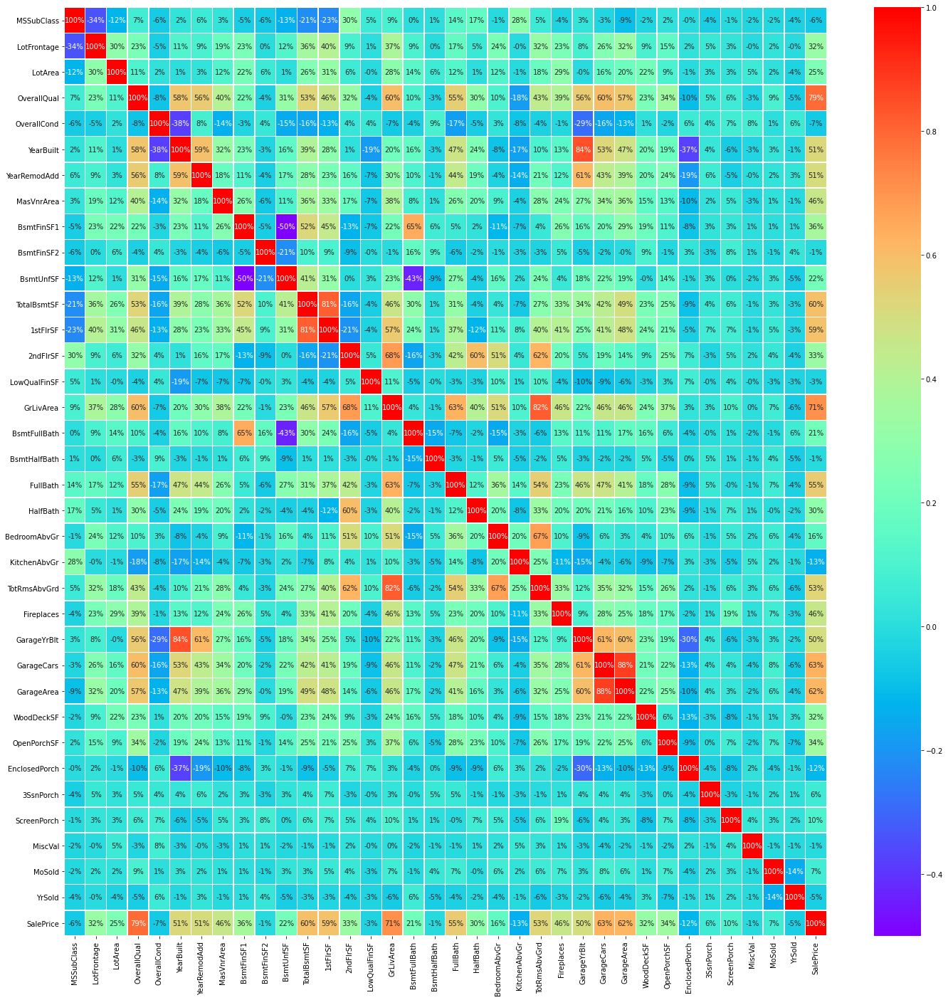

In [42]:
#Plotting heatmap for visualizing the correlation
plt.figure(figsize=(24,24))
sns.heatmap(corr,linewidth=0.5,linecolor='white',fmt='.0%',cmap='rainbow',annot=True)
plt.show()

Observations:

-> SalePrice is highly positively correlated with the columns OverallQual, YearBuilt, YearRemodAdd, TotalBsmtSF, 1stFlrSF, GrLivArea, FullBath, TotRmsAbvGrd, GarageCars, GarageArea.

-> SalePrice is negatively correlated with OverallCond, KitchenAbvGr, Encloseporch, YrSold.

-> We observe multicollinearity in between columns, so we will be using Principal Component Analysis(PCA).

Text(0.5, 1.0, 'Correaltion with target variable SalePrice')

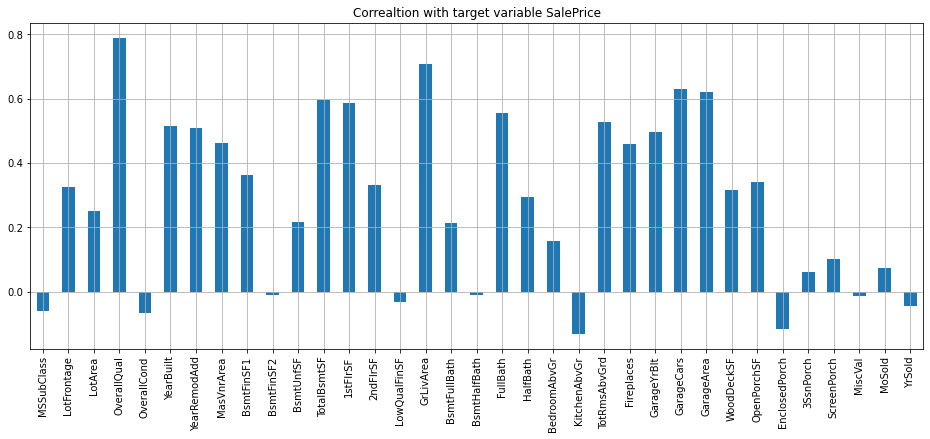

In [43]:
#Checking the correlation with the target variable SalePrice
plt.figure(figsize=(16,6))
df.drop('SalePrice', axis=1).corrwith(df['SalePrice']).plot(kind='bar',grid=True)
plt.xticks(rotation=90)
plt.title("Correaltion with target variable SalePrice")

Observations:

-> 'MSSubClass' ,'OverallCond' ,'OverallCond' ,'LowQualFinSF' ,'BsmtHalfBath' ,'KitchenAbvGr' ,'YrSold', 'EnclosedPorch', 'MiscVal' are negatively correlated with the target column,rest all are positively correlated

-> 'OverallQual' & 'GrLivArea' are highly positively correlated with target column

-> 'MSSubClass' ,'OverallCond' ,'OverallCond' ,'LowQualFinSF' ,'BsmtHalfBath' ,'YrSold', 'MiscVal', 'MoSold', '3SsnPorch' are least correlated with the target column

In [44]:
#Dropping the least correlated columns from the dataset
df.drop(['MSSubClass' ,'LowQualFinSF' ,'BsmtHalfBath' ,'BsmtUnfSF' ,'YrSold', 'MiscVal',
               'MoSold', '3SsnPorch'],axis=1,inplace=True)

In [45]:
df

,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,Fence,MiscFeature,SaleType,SaleCondition,SalePrice
0,RL,70.0,4928,Pave,No_alley_access,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,1078,GasA,TA,Y,SBrkr,958,0,958,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,No_Fence,None,WD,Normal,128000
1,RL,95.0,15865,Pave,No_alley_access,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,2217,GasA,Ex,Y,SBrkr,2217,0,2217,1,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,224,No_Fence,None,WD,Normal,268000
2,RL,92.0,9920,Pave,No_alley_access,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,1117,GasA,Ex,Y,SBrkr,1127,886,2013,1,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,No_Fence,None,WD,Normal,269790
3,RL,105.0,11751,Pave,No_alley_access,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1844,GasA,Ex,Y,SBrkr,1844,0,1844,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,MnPrv,None,COD,Normal,190000
4,RL,70.0,16635,Pave,No_alley_access,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,1602,GasA,Gd,Y,SBrkr,1602,0,1602,0,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,No_Fence,None,WD,Normal,215000
5,RL,58.0,14054,Pave,No_alley_access,IR1,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,GasA,Ex,Y,SBrkr,879,984,1863,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,No_Fence,None,New,Partial,219210
6,RL,70.0,11341,Pave,No_alley_access,IR1,Lvl,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,1392,GasA,TA,Y,SBrkr,1392,0,1392,1,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,95,No_Fence,None,WD,Normal,121500
7,RL,88.0,13125,Pave,No_alley_access,Reg,Lvl,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,1134,GasA,Ex,Y,SBrkr,1803,0,1803,1,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,GdPrv,None,WD,Normal,155000
8,RL,70.0,9170,Pave,No_alley_access,Reg,Lvl,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,1214,GasA,Ex,Y,SBrkr,1214,0,1214,1,1,0,2,1,TA,6,Typ,0,No_Fireplace,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,GdPrv,Shed,WD,Normal,140000
9,RL,80.0,8480,Pave,No_alley_access,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,832,GasA,TA,Y,SBrkr,832,384,1216,0,1,0,2,1,TA,6,Typ,0,No_Fireplace,Detchd,1947.0,Unf,1,336,TA,TA,Y,158,0,102,0,No_Fence,None,COD,Abnorml,118500


# Encoding non-numeric data using Label Encoder

In [46]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
list1=['MSZoning','Street','Alley', 'LotShape','LandContour','LotConfig','LandSlope', 'Neighborhood','Condition1','Condition2',
       'BldgType','HouseStyle','RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual','BsmtCond', 'BsmtExposure', 'BsmtFinType1','BsmtFinType2',  'Heating','HeatingQC','CentralAir',
       'Electrical', 'KitchenQual','Functional',  'FireplaceQu', 'GarageType','GarageFinish',  'GarageQual', 'GarageCond',
       'PavedDrive', 'Fence', 'MiscFeature',  'SaleType','SaleCondition', ]
for val in list1:
    df[val]=le.fit_transform(df[val].astype(str))

# Checking skewness

In [47]:
#Checking skewness
df.skew()

MSZoning         -1.796785
LotFrontage       2.733440
LotArea          10.659285
Street          -17.021969
Alley            -0.203241
LotShape         -0.603775
LandContour      -3.125982
LotConfig        -1.118821
LandSlope         4.812568
Neighborhood      0.043735
Condition1        3.008289
Condition2       11.514458
BldgType          2.318657
HouseStyle        0.285680
OverallQual       0.175082
OverallCond       0.580714
YearBuilt        -0.579204
YearRemodAdd     -0.495864
RoofStyle         1.498560
RoofMatl          7.577352
Exterior1st      -0.612816
Exterior2nd      -0.592349
MasVnrType       -0.104609
MasVnrArea        2.835718
ExterQual        -1.810843
ExterCond        -2.516219
Foundation       -0.002761
BsmtQual         -0.487530
BsmtCond         -2.816444
BsmtExposure     -1.075098
BsmtFinType1      0.100811
BsmtFinSF1        1.871606
BsmtFinType2     -3.144813
BsmtFinSF2        4.365829
TotalBsmtSF       1.744591
Heating          10.103609
HeatingQC         0.449933
C

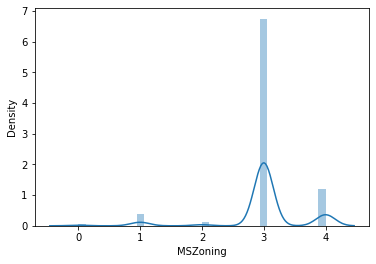

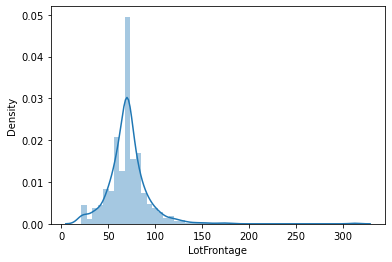

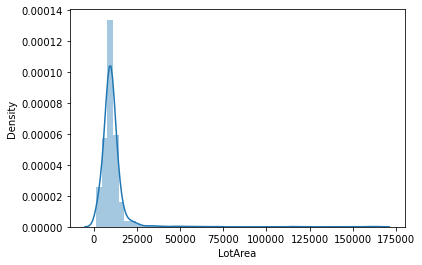

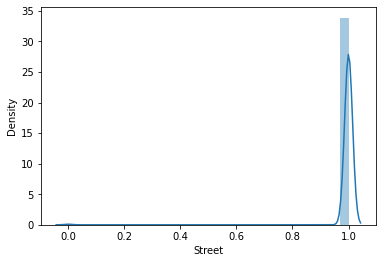

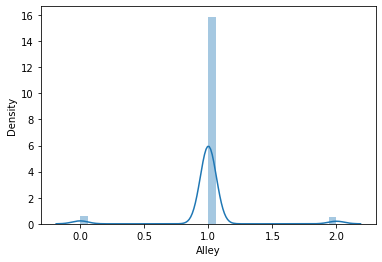

...

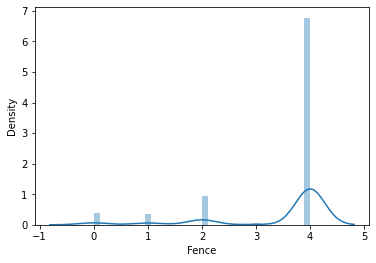

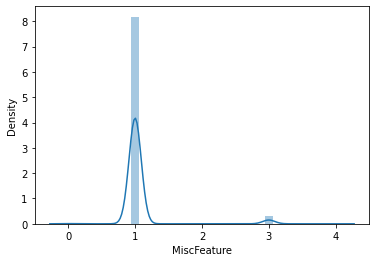

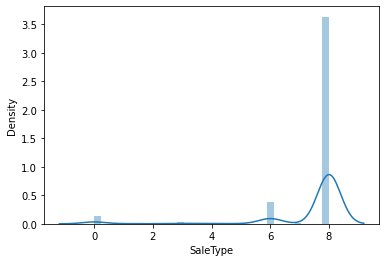

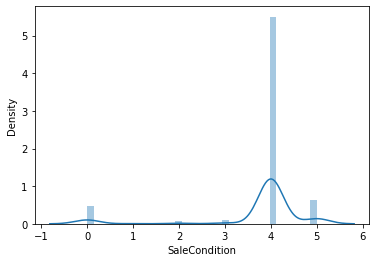

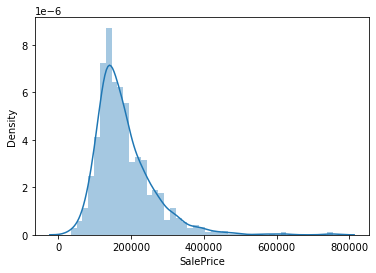

In [48]:
#Plotting distplot for checking the distribution of skewness
for col in df.describe().columns:
    sns.distplot(df[col])
    plt.show()

We can see that some of the curves are not normally distributed and it is due to the presence of high skewness and we need to handle them

# Checking outliers

MSZoning            AxesSubplot(0.125,0.816017;0.065678x0.0639831)
LotFrontage      AxesSubplot(0.203814,0.816017;0.065678x0.0639831)
LotArea          AxesSubplot(0.282627,0.816017;0.065678x0.0639831)
Street           AxesSubplot(0.361441,0.816017;0.065678x0.0639831)
Alley            AxesSubplot(0.440254,0.816017;0.065678x0.0639831)
LotShape         AxesSubplot(0.519068,0.816017;0.065678x0.0639831)
LandContour      AxesSubplot(0.597881,0.816017;0.065678x0.0639831)
LotConfig        AxesSubplot(0.676695,0.816017;0.065678x0.0639831)
LandSlope        AxesSubplot(0.755508,0.816017;0.065678x0.0639831)
Neighborhood     AxesSubplot(0.834322,0.816017;0.065678x0.0639831)
Condition1          AxesSubplot(0.125,0.739237;0.065678x0.0639831)
Condition2       AxesSubplot(0.203814,0.739237;0.065678x0.0639831)
BldgType         AxesSubplot(0.282627,0.739237;0.065678x0.0639831)
HouseStyle       AxesSubplot(0.361441,0.739237;0.065678x0.0639831)
OverallQual      AxesSubplot(0.440254,0.739237;0.065678x0.0639

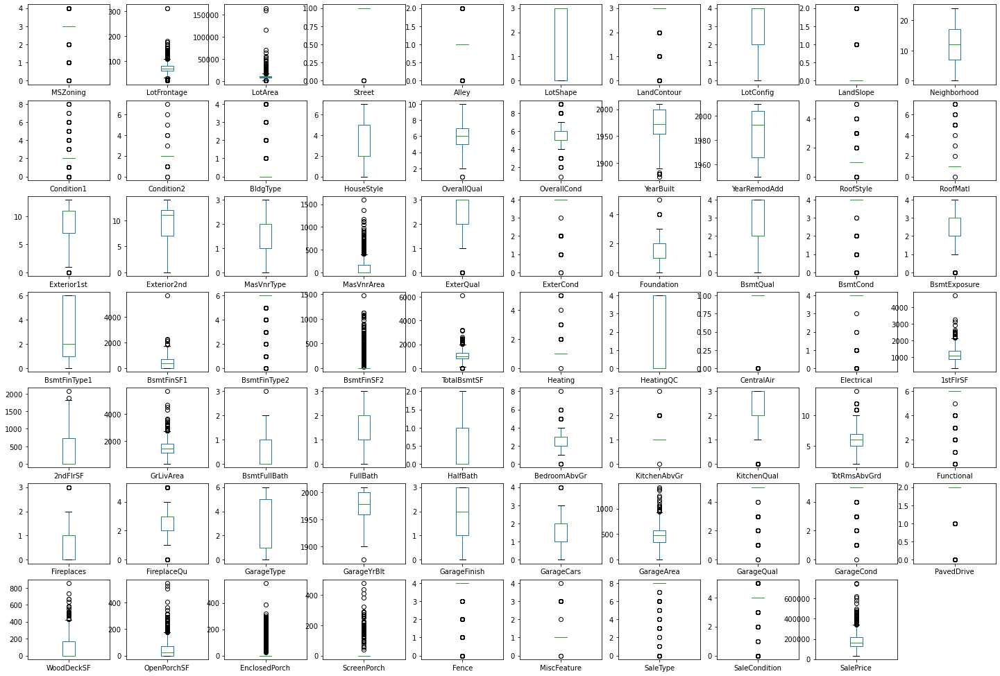

In [51]:
df.plot(kind='box',subplots=True,layout=(10,10),figsize=(25,25))

We can see that there are outliers in the dataset and we can handle them by using z-score method

# Handling outliers by using z-score method

In [53]:
#removing outliers
from scipy.stats import zscore
z_score=abs(zscore(df))
print(df.shape)

df_train=df.loc[(z_score<6).all(axis=1)]
print(df_train.shape)

(1168, 69)
(1095, 69)


When we apply z-score of 3 , 57% of the data is lost (due to the wide spread of most of the data). We compromised by enlarging the z-score cut-off to 6 resulting in a loss of few data.

# Preparing dataset for model training

In [54]:
df_x=df_train.drop(columns=['SalePrice'])
y=df_train['SalePrice']

In [55]:
#Checking x data
df_x.head()

,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,Fence,MiscFeature,SaleType,SaleCondition
0,3,70.0,4928,1,1,0,3,4,0,13,2,2,4,2,6,5,1976,1976,1,1,8,9,2,0.0,3,4,1,2,4,3,0,120,6,0,1078,1,4,1,4,958,0,958,0,2,0,2,1,3,5,6,1,5,1,1977.0,2,2,440,5,5,2,0,205,0,0,4,1,8,4
2,3,92.0,9920,1,1,0,3,1,0,15,2,2,0,5,7,5,1996,1997,1,1,7,7,2,0.0,2,4,2,2,4,0,2,862,6,0,1117,1,0,1,4,1127,886,2013,1,2,1,3,1,3,8,6,1,5,1,1997.0,3,2,455,5,5,2,180,130,0,0,4,1,8,4
3,3,105.0,11751,1,1,0,3,4,0,14,2,2,0,2,6,6,1977,1977,3,1,8,9,1,480.0,3,4,1,2,4,3,1,705,6,0,1844,1,0,1,4,1844,0,1844,0,2,0,3,1,3,7,6,1,5,1,1977.0,2,2,546,5,5,2,0,122,0,0,2,1,0,4
4,3,70.0,16635,1,1,0,3,2,0,14,2,2,0,2,6,7,1977,2000,1,1,4,4,3,126.0,2,4,1,2,4,3,0,1246,6,0,1602,1,2,1,4,1602,0,1602,0,2,0,3,1,2,8,6,1,5,1,1977.0,0,2,529,5,5,2,240,0,0,0,4,1,8,4
5,3,58.0,14054,1,1,0,3,4,0,8,2,2,0,5,7,5,2006,2006,1,1,11,12,2,0.0,2,4,2,2,4,0,6,0,6,0,879,1,0,1,4,879,984,1863,0,2,1,4,1,2,9,6,1,2,3,2006.0,0,3,660,5,5,2,100,17,0,0,4,1,6,5


In [56]:
#Checking y data after splitting
y.head()

0    128000
2    269790
3    190000
4    215000
5    219210
Name: SalePrice, dtype: int64

# Treating skewness

In [57]:
#We are treating skewness by using square root transform
import numpy as np
for col in df_x.skew().index:
    if col in df_x.describe().columns:
        if df_x[col].skew()>0.55:
            df_x[col]=np.sqrt(df_x[col])
        if df_x[col].skew()<-0.55:
            df_x[col]=np.sqrt(df_x[col])   

In [58]:
#Checking skewness after treating it
df_x.skew()   

MSZoning         -3.545090
LotFrontage      -0.236909
LotArea           0.304655
Street            0.000000
Alley            -0.174215
LotShape         -0.713208
LandContour      -3.904294
LotConfig        -1.383107
LandSlope         4.689185
Neighborhood      0.037054
Condition1       -4.371706
Condition2      -14.717263
BldgType          2.038997
HouseStyle        0.270551
OverallQual       0.171287
OverallCond       0.187465
YearBuilt        -0.606173
YearRemodAdd     -0.527446
RoofStyle         1.535289
RoofMatl         33.090784
Exterior1st      -1.632004
Exterior2nd      -1.494588
MasVnrType       -0.074670
MasVnrArea        1.016436
ExterQual        -3.518684
ExterCond        -3.002041
Foundation       -0.016471
BsmtQual         -0.486069
BsmtCond         -3.549243
BsmtExposure     -1.544130
BsmtFinType1      0.091647
BsmtFinSF1       -0.095141
BsmtFinType2     -4.409862
BsmtFinSF2        3.162691
TotalBsmtSF       0.525789
Heating         -17.178520
HeatingQC         0.464922
C

# Scaling the data

Sometimes model can be biased to higher values in dataset, so it is better to scale the dataset so that we can bring all the columns in common range. We can use StandardScaler here.

In [59]:
#Scaling the dataset using StandardScaler
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(df_x)
x=pd.DataFrame(x,columns=df_x.columns)
x

,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,Fence,MiscFeature,SaleType,SaleCondition
0,0.045740,0.074811,-1.267021,0.0,0.014247,-1.435050,0.275363,0.560583,-0.204609,0.147523,0.150369,0.067729,2.698461,-0.55211,-0.069830,-0.511829,0.147430,-0.443253,-0.498241,-0.030234,-0.076063,0.019342,0.396048,-0.737971,0.517856,0.349560,-0.579821,-0.584735,0.304896,0.543945,-1.397369,-0.409911,0.295687,-0.320974,0.077928,-0.036464,1.402563,0.249150,0.277578,-0.496283,-0.853371,-1.218221,-0.822989,0.817556,-0.782243,-1.146046,-0.204609,0.611969,-0.995195,0.232327,0.828435,1.651780,-0.768567,0.003323,0.321372,0.302216,-0.167522,0.283977,0.268178,0.270750,-0.910900,2.020925,-0.396732,-0.282325,0.417456,-0.171971,0.283327,0.236047
1,0.045740,1.102980,0.160834,0.0,0.014247,-1.435050,0.275363,-0.726254,-0.204609,0.481624,0.150369,0.067729,-0.423888,1.03051,0.679817,-0.511829,0.810349,0.569123,-0.498241,-0.030234,-0.366012,-0.505654,0.396048,-0.737971,-0.442516,0.349560,0.843730,-0.584735,0.304896,-2.200199,-0.514693,1.004604,0.295687,-0.320974,0.175346,-0.036464,-0.888831,0.249150,0.277578,0.009143,1.259358,1.103577,1.188353,0.817556,1.255654,0.142373,-0.204609,0.611969,0.980161,0.232327,0.828435,1.651780,-0.768567,0.762581,0.783401,0.302216,-0.095638,0.283977,0.268178,0.270750,0.963602,1.413902,-0.396732,-0.282325,0.417456,-0.171971,0.283327,0.236047
2,0.045740,1.652949,0.588365,0.0,0.014247,-1.435050,0.275363,0.560583,-0.204609,0.314574,0.150369,0.067729,-0.423888,-0.55211,-0.069830,0.402918,0.180655,-0.395044,2.009493,-0.030234,-0.076063,0.019342,-1.240451,2.017026,0.517856,0.349560,-0.579821,-0.584735,0.304896,0.543945,-0.956031,0.788800,0.295687,-0.320974,1.991324,-0.036464,-0.888831,0.249150,0.277578,1.817431,-0.853371,0.782436,-0.822989,0.817556,-0.782243,0.142373,-0.204609,0.611969,0.321709,0.232327,0.828435,1.651780,-0.768567,0.003323,0.321372,0.302216,0.340452,0.283977,0.268178,0.270750,-0.910900,1.339713,-0.396732,-0.282325,-0.860325,-0.171971,-5.010502,0.236047
3,0.045740,0.074811,1.587624,0.0,0.014247,-1.435050,0.275363,-0.193229,-0.204609,0.314574,0.150369,0.067729,-0.423888,-0.55211,-0.069830,1.244114,0.180655,0.713748,-0.498241,-0.030234,-1.390968,-1.462656,2.032547,0.673545,-0.442516,0.349560,-0.579821,-0.584735,0.304896,0.543945,-1.397369,1.461028,0.295687,-0.320974,1.386831,-0.036464,0.256866,0.249150,0.277578,1.254581,-0.853371,0.295743,-0.822989,0.817556,-0.782243,0.142373,-0.204609,-0.128654,0.980161,0.232327,0.828435,1.651780,-0.768567,0.003323,-1.734421,0.302216,0.258985,0.283977,0.268178,0.270750,1.253588,-0.959545,-0.396732,-0.282325,0.417456,-0.171971,0.283327,0.236047
4,0.045740,-0.555343,1.081204,0.0,0.014247,-1.435050,0.275363,0.560583,-0.204609,-0.687730,0.150369,0.067729,-0.423888,1.03051,0.679817,-0.511829,1.140563,1.002998,-0.498241,-0.030234,0.698819,0.707140,0.396048,-0.737971,-0.442516,0.349560,0.843730,-0.584735,0.304896,-2.200199,1.250659,-1.251797,0.295687,-0.320974,-0.419155,-0.036464,-0.888831,0.249150,0.277578,-0.747842,1.373138,0.819255,-0.822989,0.817556,1.255654,1.430792,-0.204609,-0.128654,1.638614,0.232327,0.828435,-0.929617,0.461840,1.103007,-1.734421,1.652936,0.886764,0.283977,0.268178,0.270750,0.486271,-0.101258,-0.396732,-0.282325,0.417456,-0.171971,-0.425912,0.701476
5,0.045740,0.074811,0.495703,0.0,0.014247,-1.435050,0.275363,0.560583,-0.204609,1.14982

# Using PCA Technique

In [60]:
# PCA is required for the analysis to reduce curse of Dimensionality & at the same time minimizing information loss 
from sklearn.decomposition import PCA
for i in range(20,50):
    pca = PCA(n_components=i)
    x_pca=pca.fit_transform(x)
    print(i," variance :{}".format(np.sum(pca.explained_variance_ratio_)))

20  variance :0.6452481564924251
21  variance :0.6601137977414566
22  variance :0.6755741422315772
23  variance :0.6900040987452649
24  variance :0.7024665232654473
25  variance :0.7169187488656317
26  variance :0.729888790983852
27  variance :0.742493152732068
28  variance :0.7547496546643334
29  variance :0.7671678647499597
30  variance :0.7793299850906278
31  variance :0.7908918722325168
32  variance :0.8019745365264288
33  variance :0.8126752151820551
34  variance :0.8227431011831418
35  variance :0.8326854500431541
36  variance :0.8425424329610314
37  variance :0.8519616207969019
38  variance :0.8613600613763358
39  variance :0.8702071774876637
40  variance :0.8790948955132122
41  variance :0.8877566635131043
42  variance :0.8959278198826994
43  variance :0.9037934302060863
44  variance :0.9110620071966941
45  variance :0.9177342101921241
46  variance :0.9243044413072782
47  variance :0.9308267108105748
48  variance :0.9369447567292686
49  variance :0.9427677364019156


In [61]:
#As 49 has the highest value, we will select that
pca = PCA(n_components=49)
x=pca.fit_transform(x)

# Building the model

In [62]:
#Importing required metrices and model for the dataset
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

In [63]:
#Finding the best random state
max_r_score=0
for r_state in range(42,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=r_state,test_size=0.20)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    y_pred=lr.predict(x_test)
    r2_scr=r2_score(y_test,y_pred)
    if r2_scr>max_r_score:
        max_r_score=r2_scr
        final_r_state=r_state
print("max r2 score corresponding to",final_r_state,"is",max_r_score)

max r2 score corresponding to 85 is 0.9109468161014069


We can see that at random_state=85, the best r2_score is obtained so that we can create our train_test_split with this random state

In [64]:
#Creating train_test_split using best random_state
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=85,test_size=.20)

# Finding the best model

In [65]:
#Importing the algorithms and other parameters
from sklearn.linear_model import LinearRegression,Lasso,Ridge,ElasticNet
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

In [66]:
LR=LinearRegression()
l=Lasso()
en=ElasticNet()
rd=Ridge()
svr=SVR()
dtr=DecisionTreeRegressor()
knr=KNeighborsRegressor()

In [67]:
models= []
models.append(('Linear Regression',LR))
models.append(('Lasso Regression',l))
models.append(('Elastic Net Regression',en))
models.append(('Ridge Regression',rd))
models.append(('Support Vector Regressor',svr))
models.append(('Decision Tree Regressor',dtr))
models.append(('KNeighbors Regressor',knr))

In [68]:
#Importing required metrics
from sklearn.metrics import mean_absolute_error,mean_squared_error
from sklearn.model_selection import cross_val_score

In [69]:
#Finding the required metrices for all models together using a for loop
Model=[]
score=[]
cvs=[]
sd=[]
mae=[]
mse=[]
rmse=[]
for name,model in models:
    print('******************************',name,'***************************')
    print('\n')
    Model.append(name)
    model.fit(x_train,y_train)
    print(model)
    pre=model.predict(x_test)
    print('\n')
    AS=r2_score(y_test,pre)
    print('r2_score: ',AS)
    score.append(AS*100)
    print('\n')
    sc=cross_val_score(model,x,y,cv=5,scoring='r2').mean()
    print('cross_val_score: ',sc)
    cvs.append(sc*100)
    print('\n')
    std=cross_val_score(model,x,y,cv=5,scoring='r2').std()
    print('Standard Deviation: ',std)
    sd.append(std)
    print('\n')
    MAE=mean_absolute_error(y_test,pre)
    print('Mean Absolute Error: ',MAE)
    mae.append(MAE)
    print('\n')
    MSE=mean_squared_error(y_test,pre)
    print('Mean Squared Error: ',MSE)
    mse.append(MSE)
    print('\n')
    RMSE=np.sqrt(mean_squared_error(y_test,pre))
    print('Root Mean Squared Error: ',RMSE)
    rmse.append(RMSE)
    print('\n\n')

****************************** Linear Regression ***************************


LinearRegression()


r2_score:  0.9109468161014069


cross_val_score:  0.853735944833051


Standard Deviation:  0.02764512613739913


Mean Absolute Error:  16259.469689259342


Mean Squared Error:  494389123.64448917


Root Mean Squared Error:  22234.862797968624



****************************** Lasso Regression ***************************


Lasso()


r2_score:  0.9109523843722717


cross_val_score:  0.8541738810778801


Standard Deviation:  0.026990869034345045


Mean Absolute Error:  16259.062927988613


Mean Squared Error:  494358210.74017155


Root Mean Squared Error:  22234.16764217117



****************************** Elastic Net Regression ***************************


ElasticNet()


r2_score:  0.9077453755740574


cross_val_score:  0.8659308100612728


Standard Deviation:  0.02172385307995583


Mean Absolute Error:  15905.841070806477


Mean Squared Error:  512162293.64724356


Root Mean Squared Err

In [70]:
#Finalizing the result
result=pd.DataFrame({'Model':Model, 'r2_score': score, 'Cross_val_score':cvs, 'Standard_deviation':sd,
                    'Mean_absolute_error':mae, 'Mean_squared_error':mse, 'Root_Mean_Squared_error':rmse})
result

,Model,r2_score,Cross_val_score,Standard_deviation,Mean_absolute_error,Mean_squared_error,Root_Mean_Squared_error
0,Linear Regression,91.094682,85.373594,0.027645,16259.469689,4.943891e+08,22234.862798
1,Lasso Regression,91.095238,85.417388,0.026991,16259.062928,4.943582e+08,22234.167642
2,Elastic Net Regression,90.774538,86.593081,0.021724,15905.841071,5.121623e+08,22631.002931
3,Ridge Regression,91.096746,85.540784,0.025219,16256.628199,4.942745e+08,22232.285859
4,Support Vector Regressor,-7.442570,-6.226762,0.058896,53839.421723,5.964799e+09,77232.114003
5,Decision Tree Regressor,76.714608,73.600557,0.047428,25847.027397,1.292716e+09,35954.355110
6,KNeighbors Regressor,87.160377,80.319838,0.028123,19740.158904,7.128067e+08,26698.439122


We can see that Ridge and Lasso Regression algorithms are performing well, as compared to other algorithms. Now we will try Hyperparameter Tuning to find out the best parameters and try to increase their scores.

# Hyperparameter Tuning

# Lasso

In [71]:
from sklearn.model_selection import GridSearchCV
#Creating parameter list to pass in GridSearchCV
parameters={'alpha' :[0.001, 0.01, 0.1, 1], 'random_state':range(42, 100), 'selection':['cyclic','random']}

In [72]:
#Using GridSearchCV to run the parameters and checking final r2_score
l=Lasso()
grid=GridSearchCV(l,parameters,cv=5,scoring='r2')
grid.fit(x_train,y_train)
print(grid.best_params_)  #Printing the best parameters obtained
print(grid.best_score_) #Mean cross-validated score of best_estimator

{'alpha': 1, 'random_state': 70, 'selection': 'random'}
0.8171377566135728


In [73]:
#Using the best parameters obtained
l=Lasso(alpha=1, random_state=65, selection='random')
l.fit(x_train,y_train)
pred=l.predict(x_test)
print('Final r2_score after tuning is: ',r2_score(y_test,pred)*100)
print('Cross validation score: ',cross_val_score(l,x,y,cv=5,scoring='r2').mean()*100)
print('Standard deviation: ',cross_val_score(l,x,y,cv=5,scoring='r2').std())
print('\n')
print('Mean absolute error: ',mean_absolute_error(y_test,pred))
print('Mean squared error: ',mean_squared_error(y_test,pred))
print('Root Mean squared error: ',np.sqrt(mean_squared_error(y_test,pred)))

Final r2_score after tuning is:  91.0952588609305
Cross validation score:  85.41786168293548
Standard deviation:  0.02698346536286041


Mean absolute error:  16259.007612058882
Mean squared error:  494357076.8944904
Root Mean squared error:  22234.142144334925


# Ridge

In [74]:
#Creating parameter list to pass in GridSearchCV
parameters={'alpha' :[0.001, 0.01, 0.1, 1], 'random_state':range(42, 100), 'solver':['auto','lsqr','svd']}

In [75]:
#Using GridSearchCV to run the parameters and checking final r2_score
rd=Ridge()
grid=GridSearchCV(rd,parameters,cv=5,scoring='r2')
grid.fit(x_train,y_train)
print(grid.best_params_)  #Printing the best parameters obtained
print(grid.best_score_) #Mean cross-validated score of best_estimator

{'alpha': 1, 'random_state': 42, 'solver': 'lsqr'}
0.8243140997854412


In [76]:
#Using the best parameters obtained
rd=Ridge(alpha=1, random_state=42, solver='lsqr')
rd.fit(x_train,y_train)
pred=rd.predict(x_test)
print('Final r2_score after tuning is: ',r2_score(y_test,pred)*100)
print('Cross validation score: ',cross_val_score(rd,x,y,cv=5,scoring='r2').mean()*100)
print('Standard deviation: ',cross_val_score(rd,x,y,cv=5,scoring='r2').std())
print('\n')
print('Mean absolute error: ',mean_absolute_error(y_test,pred))
print('Mean squared error: ',mean_squared_error(y_test,pred))
print('Root Mean squared error: ',np.sqrt(mean_squared_error(y_test,pred)))

Final r2_score after tuning is:  91.09060319564742
Cross validation score:  85.54302119480404
Standard deviation:  0.02511960758825901


Mean absolute error:  16269.158906083503
Mean squared error:  494615541.57576555
Root Mean squared error:  22239.953722428596


After Tuning the best algorithms, we can see that Lasso Regression has been improved slightly, i.e, r2_score from 91.09175 to 91.09179 and the errors have been decreased. Now, we will try Ensemble techniques like RandomForestRegressor, AdaBoostRegressor and GradientBoostingRegressor to boost up our scores.

# Ensemble Techniques for boosting our scores

# Random Forest Regressor

In [77]:
from sklearn.ensemble import RandomForestRegressor
rfr=RandomForestRegressor(random_state=85)   #Using the best random state we obtained
parameters={'n_estimators':[10,50,100,500]}
grid=GridSearchCV(rfr,parameters,cv=5,scoring='r2')
grid.fit(x_train,y_train)
print(grid.best_params_)  #Printing the best parameters obtained
print(grid.best_score_) #Mean cross-validated score of best_estimator

{'n_estimators': 500}
0.8434010741545812


In [78]:
#Using the best parameters obtained
RF=RandomForestRegressor(random_state=85, n_estimators=500)
RF.fit(x_train,y_train)
pred=RF.predict(x_test)
print('r2_score: ',r2_score(y_test,pred)*100)
print('Cross validation score: ',cross_val_score(RF,x,y,cv=5,scoring='r2').mean()*100)
print('Standard deviation: ',cross_val_score(RF,x,y,cv=5,scoring='r2').std())
print('\n')
print('Mean absolute error: ',mean_absolute_error(y_test,pred))
print('Mean squared error: ',mean_squared_error(y_test,pred))
print('Root Mean squared error: ',np.sqrt(mean_squared_error(y_test,pred)))

r2_score:  92.36487166163059
Cross validation score:  85.25935228824227
Standard deviation:  0.01880793730604784


Mean absolute error:  15185.533369863015
Mean squared error:  423873043.3734992
Root Mean squared error:  20588.177271762044


# AdaBoost Regressor

In [79]:
from sklearn.ensemble import AdaBoostRegressor
adr=AdaBoostRegressor(random_state=85)   #Using the best random state we obtained
parameters={'n_estimators':[10,50,100,500,1000],'learning_rate':[0.001,0.01,0.1,1],'loss':['linear','square']}
grid=GridSearchCV(adr,parameters,cv=5,scoring='r2')
grid.fit(x_train,y_train)
print(grid.best_params_)  #Printing the best parameters obtained
print(grid.best_score_) #Mean cross-validated score of best_estimator

{'learning_rate': 1, 'loss': 'square', 'n_estimators': 1000}
0.8045806123628967


In [80]:
#Using the best parameters obtained
adr=AdaBoostRegressor(random_state=85, n_estimators=1000, learning_rate=1, loss='square')
adr.fit(x_train,y_train)
pred=adr.predict(x_test)
print("r2_score: ",r2_score(y_test,pred)*100)
print('Cross validation score: ',cross_val_score(adr,x,y,cv=5,scoring='r2').mean()*100)
print('Standard deviation: ',cross_val_score(adr,x,y,cv=5,scoring='r2').std())
print('\n')
print('Mean absolute error: ',mean_absolute_error(y_test,pred))
print('Mean squared error: ',mean_squared_error(y_test,pred))
print('Root Mean squared error: ',np.sqrt(mean_squared_error(y_test,pred)))

r2_score:  87.65420319190278
Cross validation score:  82.26912743313555
Standard deviation:  0.028153847979881373


Mean absolute error:  20313.380435029325
Mean squared error:  685391290.6245395
Root Mean squared error:  26179.97881253038


# Gradient Boosting Regressor

In [81]:
from sklearn.ensemble import GradientBoostingRegressor
gbr=GradientBoostingRegressor(random_state=85)   #Using the best random state we obtained
parameters={'n_estimators':[10,50,100,500,1000]}
grid=GridSearchCV(gbr,parameters,cv=5,scoring='r2')
grid.fit(x_train,y_train)
print(grid.best_params_)  #Printing the best parameters obtained
print(grid.best_score_) #Mean cross-validated score of best_estimator

{'n_estimators': 1000}
0.8658937212079826


In [82]:
#Using the best parameters obtained
gbr=GradientBoostingRegressor(random_state=85, n_estimators=500)
gbr.fit(x_train,y_train)
pred=gbr.predict(x_test)
print("r2_score: ",r2_score(y_test,pred)*100)
print('Cross validation score: ',cross_val_score(gbr,x,y,cv=5,scoring='r2').mean()*100)
print('Standard deviation: ',cross_val_score(gbr,x,y,cv=5,scoring='r2').std())
print('\n')
print('Mean absolute error: ',mean_absolute_error(y_test,pred))
print('Mean squared error: ',mean_squared_error(y_test,pred))
print('Root Mean squared error: ',np.sqrt(mean_squared_error(y_test,pred)))

r2_score:  92.00445666711192
Cross validation score:  86.8821779389433
Standard deviation:  0.01350676388675029


Mean absolute error:  15492.786138894857
Mean squared error:  443881901.61840194
Root Mean squared error:  21068.50496875376


After applying Ensemble Techniques, we can see that GradientBoostingRegressor is the best performing algorithm among all other algorithms as it is giving a r2_score of 92.69 and cross validation score of 86.97. It has also the less amount of error values obtained. Lesser the RMSE score, the better the model. Now we will finalize the model.

# Finalizing the model

In [83]:
gbr_prediction=gbr.predict(x)
print('Predictions of GradientBoosting Regressor: ',gbr_prediction)   #Printing the predicted values

Predictions of GradientBoosting Regressor:  [130371.34173345 242601.4538183  193055.96252947 ... 151005.54500029
  40414.58354508 182952.41514823]


In [85]:
#Saving the model
import pickle
filename='Housing_Price_Project.pkl'   #Specifying the filename
pickle.dump(gbr,open(filename,'wb'))  

# Saving the predicted values

In [86]:
train_results=pd.DataFrame(gbr_prediction)
train_results.to_csv('Housing_Price_Project_TrainDataResults.csv')

Now, we have saved the model which has the predictions of the training data we had used. Next, we will use the test data and find the predictions using the best model we obtained

# Now loading the test dataset

In [87]:
df=pd.read_csv("test.csv")
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
df.head(15)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,

In [88]:
#Checking the dimensions of the dataset
df.shape    

(292, 80)

In [89]:
#Removing all the columns we did in train dataset
df.drop(['Utilities'],axis=1,inplace=True)
df.drop('Id',axis=1,inplace=True)  # id column not necessary for prediction
df.drop('PoolArea',axis=1,inplace=True) # contains same value in every row
df.drop('PoolQC',axis=1,inplace=True) # contains same value in every row

In [90]:
#Checking for null values in the test dataset for top 30 columns
df.isnull().sum().sort_values(ascending=False).head(30)  

MiscFeature      282
Alley            278
Fence            248
FireplaceQu      139
LotFrontage       45
GarageCond        17
GarageQual        17
GarageType        17
GarageYrBlt       17
GarageFinish      17
BsmtFinType2       7
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
Electrical         1
MasVnrArea         1
MasVnrType         1
ExterCond          0
YearRemodAdd       0
Foundation         0
ExterQual          0
Exterior2nd        0
Exterior1st        0
RoofMatl           0
RoofStyle          0
SaleCondition      0
YearBuilt          0
OverallCond        0
OverallQual        0
dtype: int64

# Handling missing data

In [91]:
basement=['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']
#NA means No_Basement for all i in basement. Let's replace NAs with 'No_Basement'
for i in basement:
    df[i].fillna('No_Basement',inplace=True)
    print(df[i].value_counts())
    
#As per given definition, NA means None. Let's replace NAs with 'None'
df['MiscFeature'].fillna('None',inplace=True)
print(df['MiscFeature'].value_counts())

#As per given definition, NA means No_alley_access. Let's replace missing data with 'No_alley_access'
df['Alley'].fillna('No_alley_access',inplace=True)
print(df['Alley'].value_counts())

#As per given definition, NA means No_Fence. Let's replace missing data with 'No_Fence'
df['Fence'].fillna('No_Fence',inplace=True)
print(df['Fence'].value_counts())

#NA means No_Fireplace. Let's replace missing data with 'No_Fireplace'
df['FireplaceQu'].fillna('No_Fireplace',inplace=True)
print(df['FireplaceQu'].value_counts())

#Let's Impute the missing values and replace it with the median
df['LotFrontage'].fillna(df['LotFrontage'].median(),inplace=True)

garage=['GarageType','GarageFinish','GarageQual','GarageCond']
#NA means No_Garage for all i in garage
for i in garage:
    df[i].fillna('No_Garage',inplace=True)
    print(df[i].value_counts())
    
#As per dataframe "df" we can say that most of the rows of GarageYrBlt has same value as YearBuilt so we replace with that
df["GarageYrBlt"]=df["GarageYrBlt"].fillna(df["YearBuilt"])
print(df['GarageYrBlt'].value_counts())    
    
#As per given values of MasVnrArea,  Let's replace missing data with 0's
df['MasVnrArea'].fillna(0,inplace=True)
print(df['MasVnrArea'].value_counts())

#Let's fill the missing values in MasVnrType with None
df['MasVnrType'] = df['MasVnrType'].fillna('None')

TA             132
Gd             120
Ex              27
No_Basement      7
Fa               6
Name: BsmtQual, dtype: int64
TA             270
Gd               9
No_Basement      7
Fa               6
Name: BsmtCond, dtype: int64
No             197
Av              41
Gd              26
Mn              21
No_Basement      7
Name: BsmtExposure, dtype: int64
GLQ            88
Unf            85
ALQ            46
BLQ            27
Rec            24
LwQ            15
No_Basement     7
Name: BsmtFinType1, dtype: int64
Unf            254
Rec             11
BLQ              9
No_Basement      7
LwQ              6
ALQ              3
GLQ              2
Name: BsmtFinType2, dtype: int64
None    282
Shed      9
Othr      1
Name: MiscFeature, dtype: int64
No_alley_access    278
Grvl                 9
Pave                 5
Name: Alley, dtype: int64
No_Fence    248
MnPrv        28
GdPrv         8
GdWo          7
MnWw          1
Name: Fence, dtype: int64
No_Fireplace    139
Gd               79
TA       

In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     292 non-null    int64  
 1   MSZoning       292 non-null    object 
 2   LotFrontage    292 non-null    float64
 3   LotArea        292 non-null    int64  
 4   Street         292 non-null    object 
 5   Alley          292 non-null    object 
 6   LotShape       292 non-null    object 
 7   LandContour    292 non-null    object 
 8   LotConfig      292 non-null    object 
 9   LandSlope      292 non-null    object 
 10  Neighborhood   292 non-null    object 
 11  Condition1     292 non-null    object 
 12  Condition2     292 non-null    object 
 13  BldgType       292 non-null    object 
 14  HouseStyle     292 non-null    object 
 15  OverallQual    292 non-null    int64  
 16  OverallCond    292 non-null    int64  
 17  YearBuilt      292 non-null    int64  
 18  YearRemodA

In [93]:
#making seperate lists of categorical and continuos varioables
categorical=[x for x in df.columns if df[x].dtype==object]
cont=[x for x in df.columns if x not in categorical]

In [94]:
#Checking the length of the lists
print(len(categorical),len(cont))   

41 35


In [95]:
#Dropping the least correlated columns from the dataset
df.drop(['MSSubClass' ,'LowQualFinSF' ,'BsmtHalfBath' ,'BsmtUnfSF' ,'YrSold', 'MiscVal',
               'MoSold', '3SsnPorch'],axis=1,inplace=True)

# Encoding non-numeric data using Label Encoder

In [96]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
list1=['MSZoning','Street','Alley', 'LotShape','LandContour','LotConfig','LandSlope', 'Neighborhood','Condition1','Condition2',
       'BldgType','HouseStyle','RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual','BsmtCond', 'BsmtExposure', 'BsmtFinType1','BsmtFinType2',  'Heating','HeatingQC','CentralAir',
       'Electrical', 'KitchenQual','Functional',  'FireplaceQu', 'GarageType','GarageFinish',  'GarageQual', 'GarageCond',
       'PavedDrive', 'Fence', 'MiscFeature',  'SaleType','SaleCondition', ]
for val in list1:
    df[val]=le.fit_transform(df[val].astype(str))

# Checking skewness

In [97]:
df.skew()

MSZoning          0.187174
LotFrontage       0.499491
LotArea          12.781805
Street          -12.020386
Alley            -1.130060
LotShape         -0.639195
LandContour      -3.332422
LotConfig        -1.204667
LandSlope         4.639043
Neighborhood      0.046894
Condition1        2.808950
Condition2       17.088007
BldgType          1.997202
HouseStyle        0.386773
OverallQual       0.397312
OverallCond       1.209714
YearBuilt        -0.755233
YearRemodAdd     -0.535600
RoofStyle         1.386333
RoofMatl         13.717569
Exterior1st      -0.643455
Exterior2nd      -0.672944
MasVnrType        0.037914
MasVnrArea        1.978463
ExterQual        -1.920606
ExterCond        -3.595056
Foundation        0.380626
BsmtQual         -0.536455
BsmtCond         -3.979314
BsmtExposure     -1.199372
BsmtFinType1      0.149521
BsmtFinSF1        0.739790
BsmtFinType2     -3.326370
BsmtFinSF2        3.698543
TotalBsmtSF       0.519257
Heating           8.212666
HeatingQC         0.408904
C

In [98]:
#We are treating skewness by using square root transform
import numpy as np
for col in df.skew().index:
    if col in df.describe().columns:
        if df[col].skew()>0.55:
            df[col]=np.sqrt(df[col])
        if df[col].skew()<-0.55:
            df[col]=np.sqrt(df[col])   

In [99]:
#Checking skewness after removal
df.skew()   

MSZoning          0.187174
LotFrontage       0.499491
LotArea           5.201616
Street          -12.020386
Alley            -4.525012
LotShape         -0.703054
LandContour      -3.821158
LotConfig        -1.540456
LandSlope         4.173753
Neighborhood      0.046894
Condition1       -4.094832
Condition2       17.088007
BldgType          1.785749
HouseStyle        0.386773
OverallQual       0.397312
OverallCond       0.870844
YearBuilt        -0.770262
YearRemodAdd     -0.535600
RoofStyle         1.145759
RoofMatl         12.535240
Exterior1st      -1.357689
Exterior2nd      -1.430894
MasVnrType        0.037914
MasVnrArea        0.886166
ExterQual        -3.611008
ExterCond        -6.323431
Foundation        0.380626
BsmtQual         -0.536455
BsmtCond         -4.978585
BsmtExposure     -1.632765
BsmtFinType1      0.149521
BsmtFinSF1       -0.107664
BsmtFinType2     -4.190509
BsmtFinSF2        2.921229
TotalBsmtSF       0.519257
Heating           6.774861
HeatingQC         0.408904
C

# Scaling the data

Sometimes model can be biased to higher values in dataset, so it is better to scale the dataset so that we can bring all the columns in common range. We can use StandardScaler here.

In [100]:
#Scaling the dataset using StandardScaler
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(df)
x=pd.DataFrame(x,columns=df.columns)
x

,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,Fence,MiscFeature,SaleType,SaleCondition
0,-0.287006,0.992288,0.644437,0.083045,0.130237,-1.432186,-1.681950,-2.251950,-0.231475,1.554460,0.155936,-0.058621,-0.462156,-0.518671,2.157766,-0.447311,1.061793,1.031595,1.829386,-0.081841,0.669730,0.692233,1.952161,0.942344,-0.489875,0.285512,0.776109,-2.087866,0.238180,-0.667301,-0.490660,1.459187,0.296710,-0.331085,2.074477,-0.152799,-0.880154,0.248633,0.299915,1.986953,-0.851459,0.921022,1.132656,0.776457,-0.736397,0.254952,-0.220384,-0.168229,0.949327,0.199542,0.651586,-0.933412,-0.748584,1.058618,-1.652113,1.687009,1.038573,0.300071,0.273248,0.268436,1.033621,0.472839,-0.374277,-0.273027,0.352837,-0.187517,0.196229,0.219011
1,-0.287006,-0.060430,-0.655483,0.083045,0.130237,-1.432186,0.277578,-0.847677,-0.231475,1.554460,0.155936,-0.058621,2.477762,-0.518671,1.419117,-0.447311,0.376733,-0.064496,-0.508361,-0.081841,-0.920773,-1.112288,0.355435,-0.763424,-0.489875,0.285512,-0.518884,-0.554138,0.238180,-2.305918,-0.490660,1.214629,0.296710,-0.331085,0.418166,-0.152799,0.645098,0.248633,0.299915,0.681264,-0.851459,-0.155600,1.132656,-1.051974,-0.736397,-2.226584,-0.220384,-0.168229,-1.529842,0.199542,0.651586,-2.680569,-0.748584,0.256702,0.361812,0.359228,0.511068,0.300071,0.273248,0.268436,0.269442,-0.997577,-0.374277,-0.273027,0.352837,-0.187517,-7.117049,-3.595534
2,-0.287006,-0.060430,0.334751,0.083045,0.130237,0.729469,0.277578,0.556597,-0.231475,-1.281387,0.155936,-0.058621,-0.462156,-0.518671,1.419117,-0.447311,0.931583,0.782483,1.829386,-0.081841,0.669730,0.692233,0.355435,-0.763424,-0.489875,0.285512,0.776109,-0.554138,0.238180,-2.305918,1.289125,-1.280921,0.296710,-0.331085,1.675735,-0.152799,-0.880154,0.248633,0.299915,1.695176,-0.851459,0.680433,-0.836008,0.776457,-0.736397,0.254952,-0.220384,-3.521573,0.402647,0.199542,0.651586,1.687322,-0.748584,0.906197,0.361812,0.359228,0.306719,0.300071,0.273248,0.268436,1.156781,1.532559,-0.374277,-0.273027,0.352837,-0.187517,0.196229,0.219011
3,-0.287006,0.440864,0.357320,0.083045,0.130237,0.729469,-4.358713,0.556597,-0.231475,-1.114572,0.155936,-0.058621,-0.462156,1.011146,0.680468,1.431893,-1.037416,-1.758454,-0.508361,-0.081841,-0.476429,-0.428120,0.355435,-0.763424,0.496326,0.285512,-0.518884,0.979590,0.238180,0.532249,0.844179,0.004818,0.296710,-0.331085,-0.799293,-0.152799,-0.880154,0.248633,0.299915,-0.735065,1.039395,0.257156,-0.836008,-1.051974,1.334595,0.254952,-0.220384,-1.150401,0.402647,0.199542,0.651586,-0.933412,-0.748584,-1.398668,0.814431,-0.968552,-1.061944,0.300071,0.273248,0.268436,-0.852879,-0.997577,-0.374277,-0.273027,0.352837,-0.187517,0.196229,0.219011
4,-0.287006,0.992288,0.700377,0.083045,0.130237,-1.432186,0.277578,-0.847677,-0.231475,1.387645,-0.662044,-0.058621,-0.462156,1.011146,-0.058181,-0.447311,1.126850,1.081417,-0.508361,-0.081841,0.669730,0.692233,1.952161,0.274154,-0.489875,0.285512,0.776109,-0.554138,0.238180,0.011436,1.289125,-1.280921,0.296710,-0.331085,-0.351004,-0.152799,-0.880154,0.248633,0.299915,-0.627407,1.445639,0.940393,-0.836008,0.776457,1.334595,1.495721,-0.220384,-0.168229,1.462780,0.199542,0.651586,-0.933412,0.489034,1.134771,-1.652113,1.687009,1.000555,0.300071,0.273248,0.268436,0.561112,-0.124020,-0.374277,-0.273027,0.352837,-0.187517,0.196229,0.219011
5,1.808136,-2.266125,-1.636488,0.083045,

# Using PCA Technique

In [101]:
# PCA is required for the analysis to reduce curse of Dimensionality & at the same time minimizing information loss 
from sklearn.decomposition import PCA
for i in range(20,50):
    pca = PCA(n_components=i)
    x_pca=pca.fit_transform(x)
    print(i," variance :{}".format(np.sum(pca.explained_variance_ratio_)))

20  variance :0.6878382202489025
21  variance :0.7035643734546801
22  variance :0.7184140181533845
23  variance :0.7331179633966745
24  variance :0.7471672658168242
25  variance :0.7609358267656487
26  variance :0.7741857868454928
27  variance :0.7860204672281347
28  variance :0.7976416182261394
29  variance :0.8091437213660734
30  variance :0.8195196644848763
31  variance :0.8293624454755152
32  variance :0.8390543920806268
33  variance :0.848239132705123
34  variance :0.8572870859723241
35  variance :0.8658394822888796
36  variance :0.8741519576746823
37  variance :0.8821978564843609
38  variance :0.8899551051160157
39  variance :0.8976050346780888
40  variance :0.9049191720434647
41  variance :0.9119232272654152
42  variance :0.9184733496817232
43  variance :0.9247832279442549
44  variance :0.9309584440868255
45  variance :0.9366194919151553
46  variance :0.9416284254631571
47  variance :0.946487347741742
48  variance :0.9509817181321427
49  variance :0.955342245980023


In [102]:
#As 49 has the highest value, we will select that
pca = PCA(n_components=49)
x=pca.fit_transform(x)

# Loading the saved model

In [103]:
fitted_model=pickle.load(open('Housing_Price_Project.pkl','rb'))

In [104]:
#Checking the model we have saved
fitted_model   

GradientBoostingRegressor(n_estimators=500, random_state=85)

We can see that GradientBoostingRegressor algorithm, which was finalized and saved after we found that it was the best model performing, is loaded and it is also showing the best parameters we obtained while doing Hyperparameter Tuning.

# Predictions over test data

In [118]:
 #Predicting the values
 test_predictions=fitted_model.predict(x)   

In [119]:
#Making a dataframe for the predictions
test_predictions=pd.DataFrame(test_predictions,columns=['SalePrice'])
test_predictions

,SalePrice
0,325135.725032
1,203435.871221
2,245942.872741
3,141223.630114
4,263031.215979
5,107366.876516
6,170039.384815
7,299534.539570
8,257401.250776
9,200094.696851


# Saving the predicted values

In [120]:
test_results=pd.DataFrame(test_predictions)
test_results.to_csv('Housing_Price_Project_TestDataResults.csv')